In [1]:
import os
import re
import warnings
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

In [10]:
data = pd.read_csv('binance_1h_2022-2025.csv')

In [11]:
# Check for Missing Values, TODO: other consistency checks 
print("\nMissing Values in Daily Data:")
print(data.isnull().sum())


Missing Values in Daily Data:
date          0
1inch-usdt    0
aave-usdt     0
algo-usdt     0
amp-usdt      0
             ..
win-usdt      0
xec-usdt      0
xvg-usdt      0
yfi-usdt      0
ygg-usdt      0
Length: 97, dtype: int64


In [12]:
data['date'] = pd.to_datetime(data['date'])  # Ensure the column is datetime type
data = data.set_index('date')  # Set it as the index

In [13]:
data.head()

,1inch-usdt,aave-usdt,algo-usdt,amp-usdt,ankr-usdt,ar-usdt,arpa-usdt,avax-usdt,axs-usdt,badger-usdt,...,troy-usdt,tru-usdt,twt-usdt,uma-usdt,uni-usdt,win-usdt,xec-usdt,xvg-usdt,yfi-usdt,ygg-usdt
date,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2.421,262.2,1.6913,0.04869,0.10228,61.66,0.09863,111.71,94.40,14.69,...,0.010668,0.3211,0.7188,9.186,17.21,0.000459,0.000110,0.01726,33450.57,5.394
2022-01-01 01:00:00,2.428,259.9,1.6822,0.04880,0.10349,62.81,0.09868,109.69,93.95,14.72,...,0.010652,0.3218,0.7188,9.229,17.27,0.000457,0.000110,0.01729,33707.45,5.406
2022-01-01 02:00:00,2.437,260.0,1.6834,0.04879,0.10233,62.49,0.09938,110.77,94.32,14.76,...,0.010699,0.3212,0.7170,9.199,17.25,0.000458,0.000109,0.01748,33668.01,5.412
2022-01-01 03:00:00,2.432,261.2,1.6842,0.04843,0.10198,62.76,0.09859,109.72,93.78,14.81,...,0.010679,0.3199,0.7148,9.169,17.16,0.000457,0.000109,0.01754,33573.73,5.355
2022-01-01 04:00:00,2.410,258.8,1.6670,0.04817,0.10147,61.96,0.09796,108.98,93.61,14.73,...,0.010629,0.3172,0.7115,9.160,17.19,0.000455,0.000109,0.01765,33758.59,5.350


In [14]:
# Resample data to daily frequency (mean of each day)
data_daily = data.resample('D').mean()

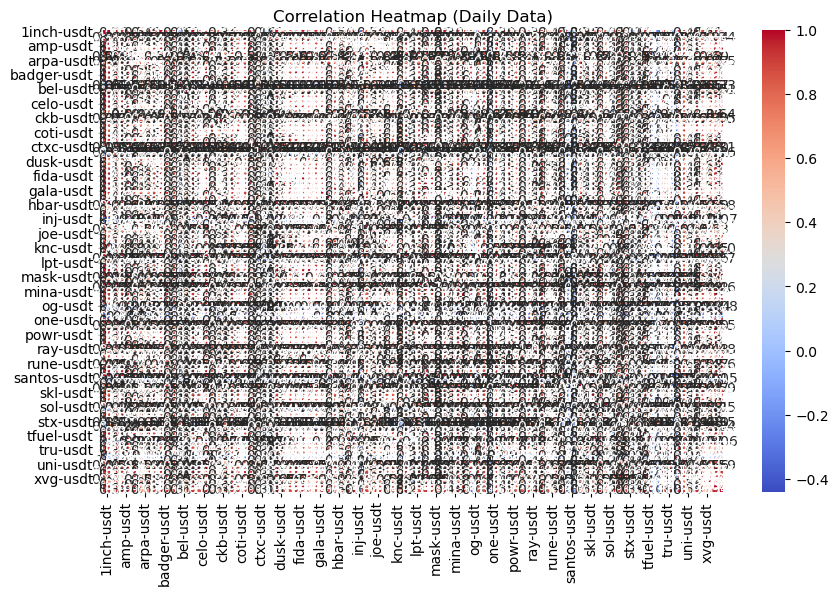

In [27]:
# Plotting all together is not a good idea
plt.figure(figsize=(10, 6))
sns.heatmap(data_daily.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap (Daily Data)")
plt.show()

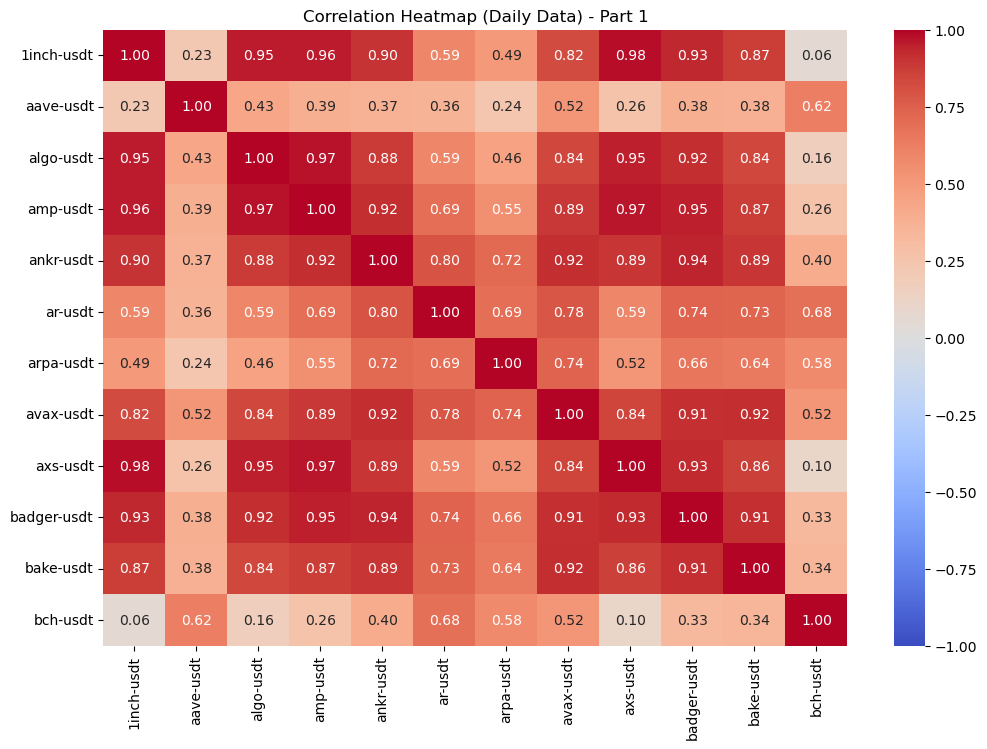

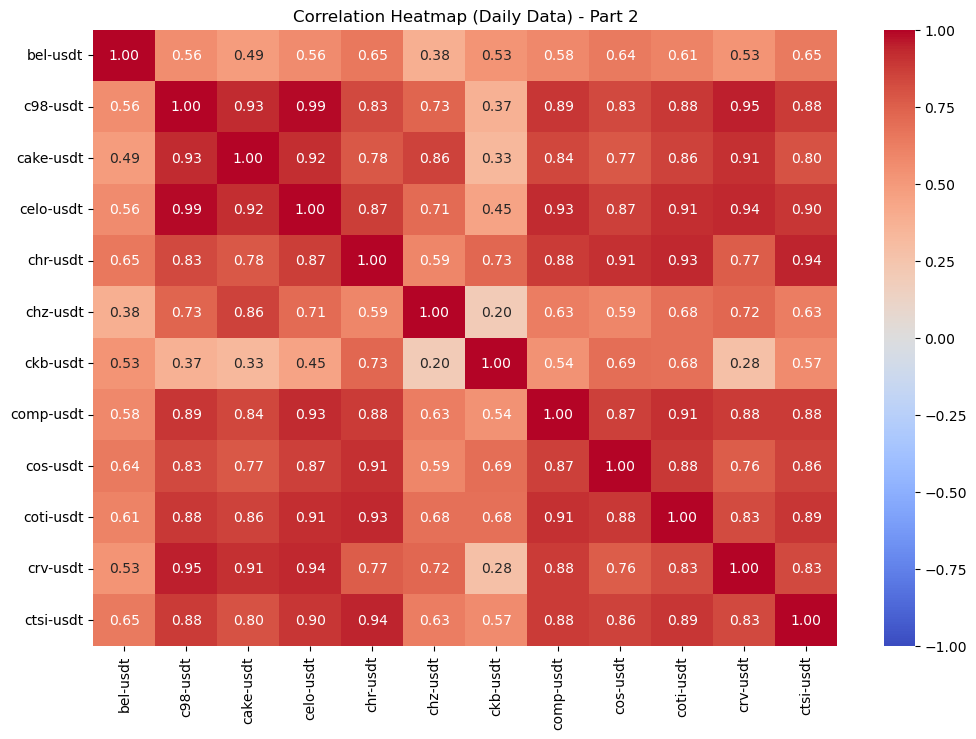

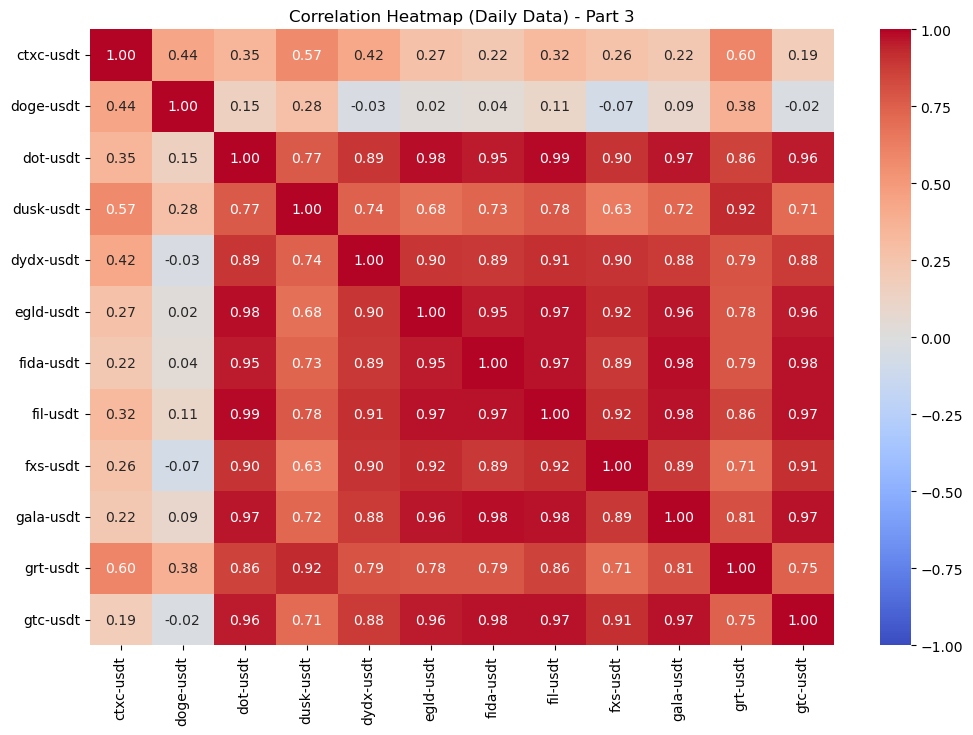

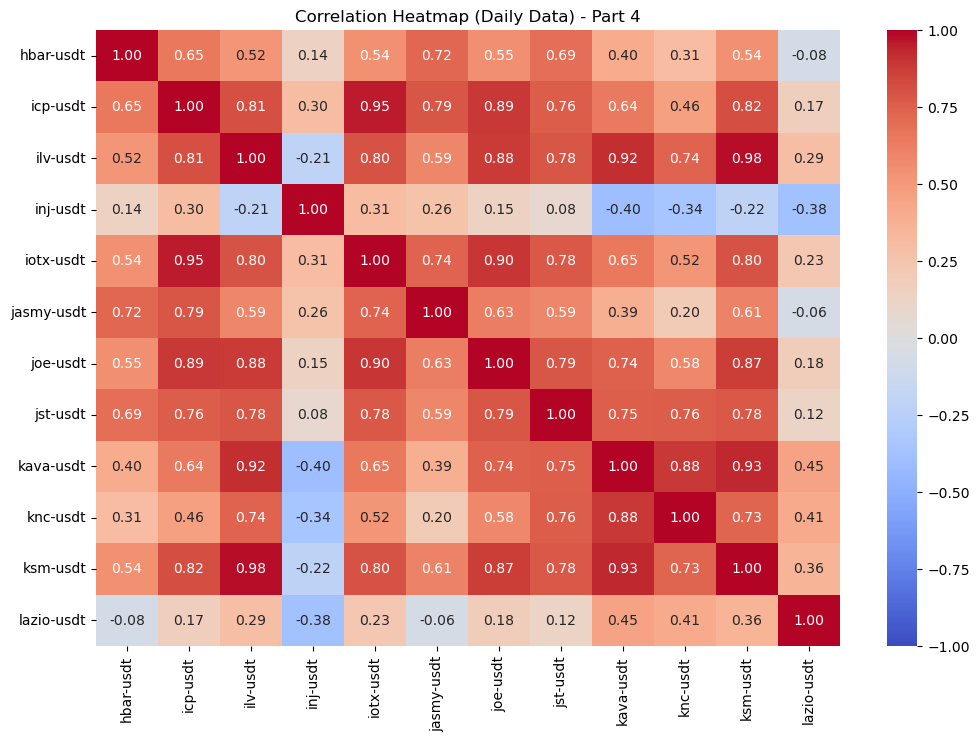

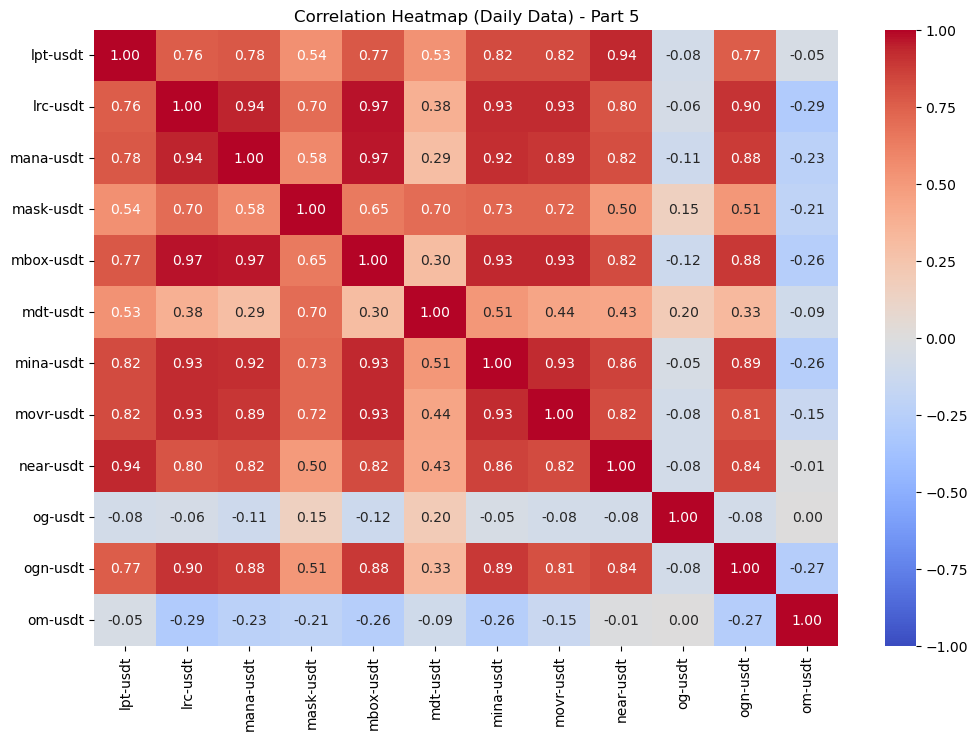

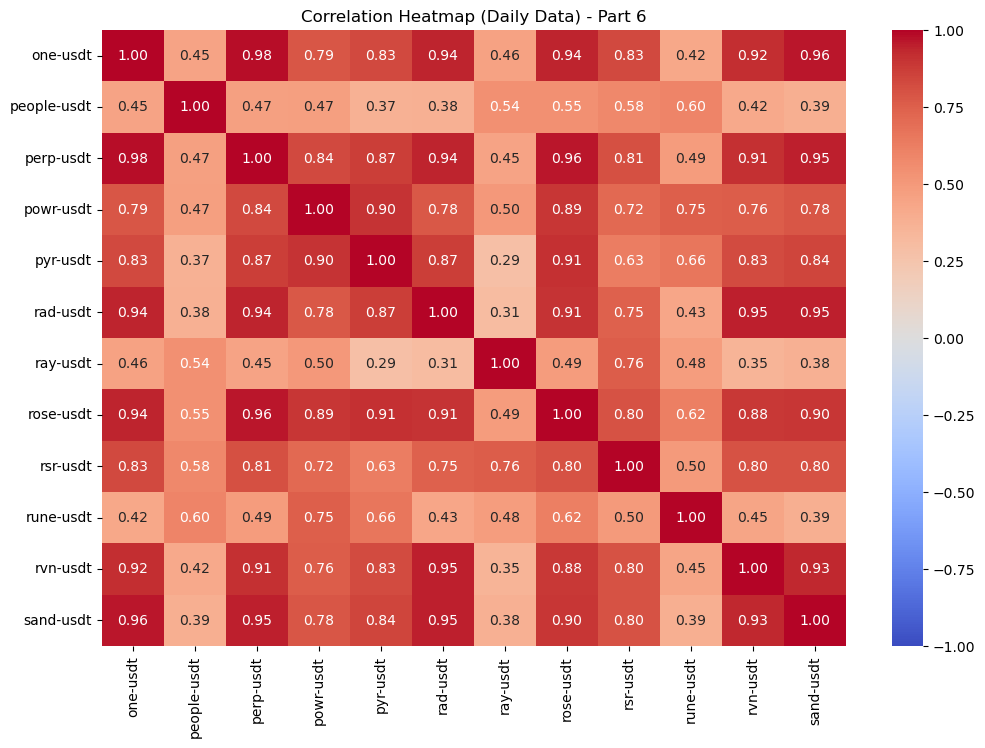

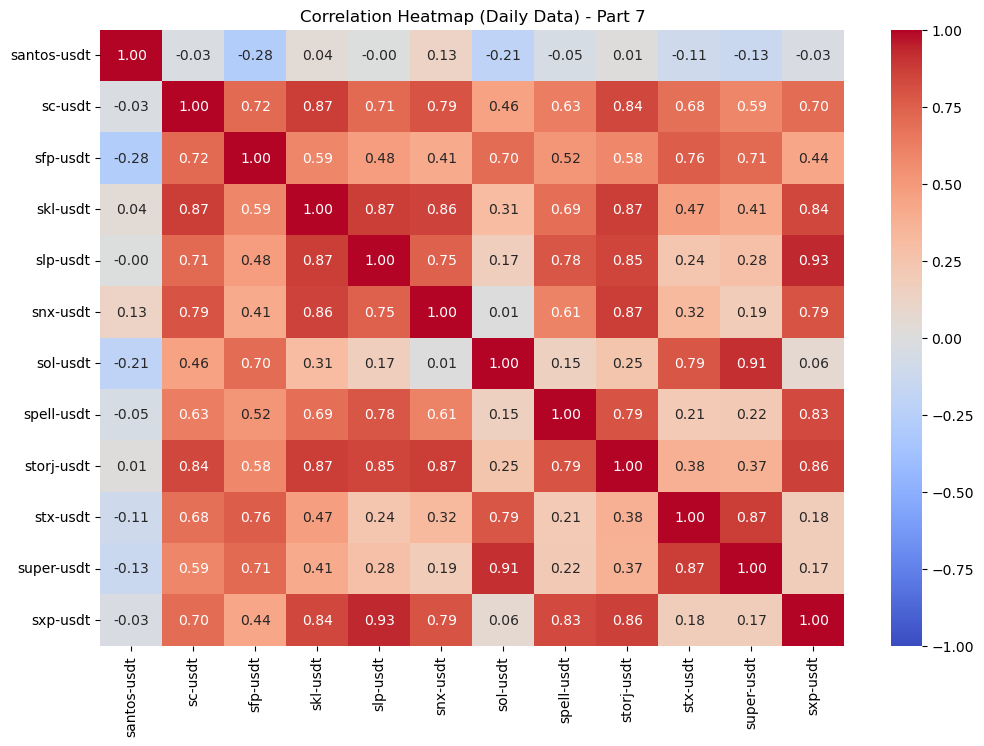

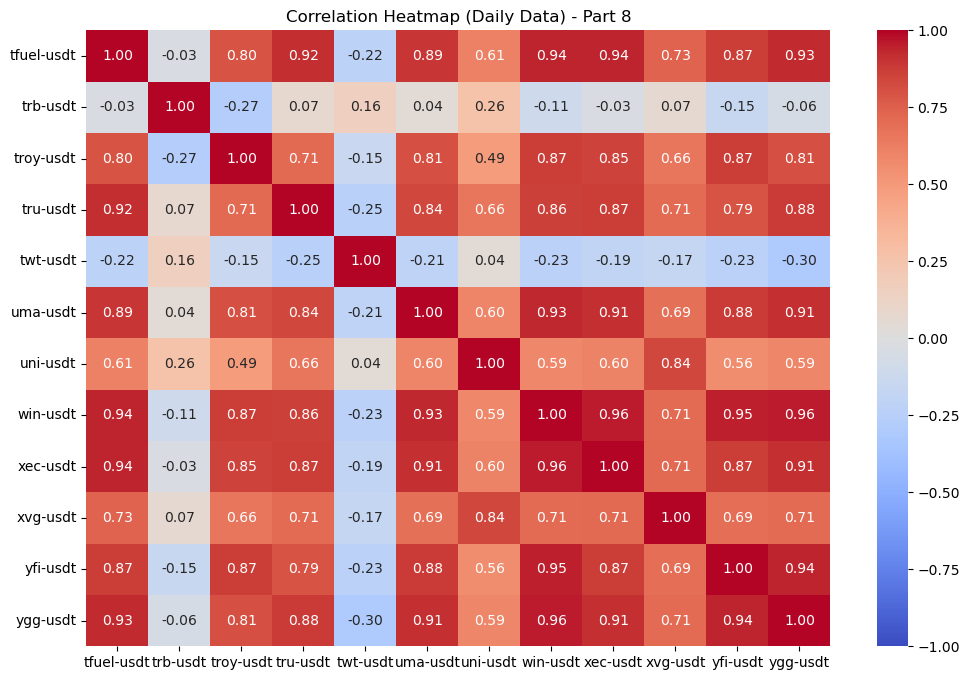

In [25]:
columns_per_plot = 12 
n_cols = data_daily.shape[1]
n_plots = int(np.ceil(n_cols / columns_per_plot))  # How many plots we need

# Split and plot
for i in range(n_plots):
    start_col = i * columns_per_plot
    end_col = min((i + 1) * columns_per_plot, n_cols)
    cols = data_daily.columns[start_col:end_col]
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(data_daily[cols].corr(), annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
    plt.title(f"Correlation Heatmap (Daily Data) - Part {i+1}")
    plt.show()


## Stationarity checks

In [22]:
def check_stationarity(series, column_name):
    result = adfuller(series.dropna())
    p_value = result[1]
    stationary = p_value <= 0.05
    return {
        "Column": column_name,
        "Stationary": stationary
    }

In [23]:
results = []
for column in data_daily.columns:
    results.append(check_stationarity(data_daily[column], column))

stationarity_df = pd.DataFrame(results)

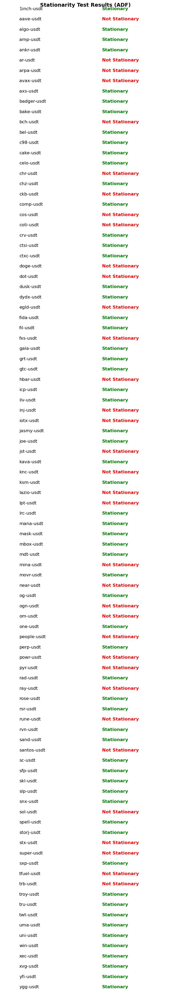

In [24]:
fig, ax = plt.subplots(figsize=(8, len(stationarity_df) * 0.5))
colors = ['green' if status else 'red' for status in stationarity_df['Stationary']]

for i, (col_name, stationary) in enumerate(zip(stationarity_df['Column'], stationarity_df['Stationary'])):
    ax.text(0.1, 1 - i / len(stationarity_df), col_name, fontsize=12, va='center')
    ax.text(0.6, 1 - i / len(stationarity_df), "Stationary" if stationary else "Not Stationary",
            fontsize=12, va='center', color=colors[i], fontweight='bold')

# Remove axes
ax.axis('off')

# Title
plt.title("Stationarity Test Results (ADF)", fontsize=14, fontweight='bold')

plt.show()


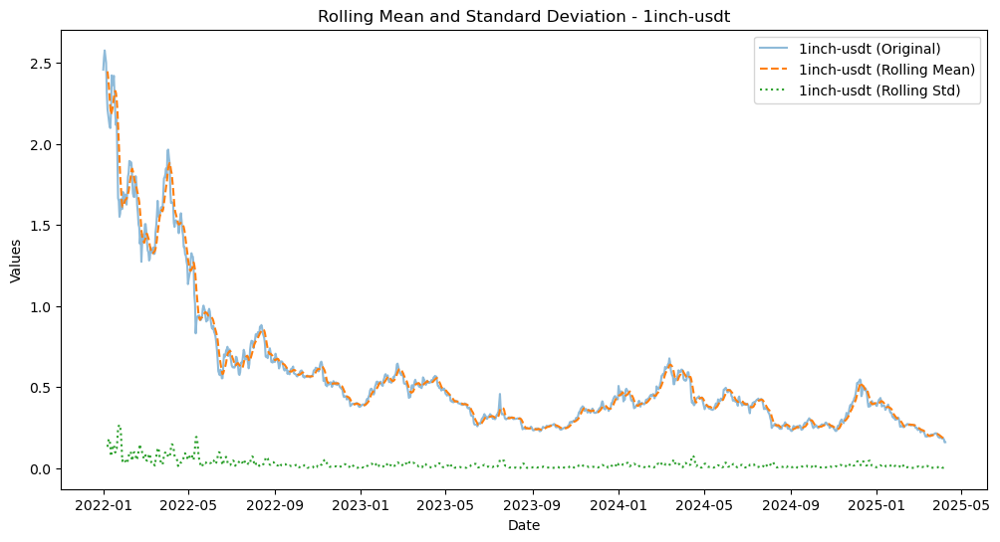

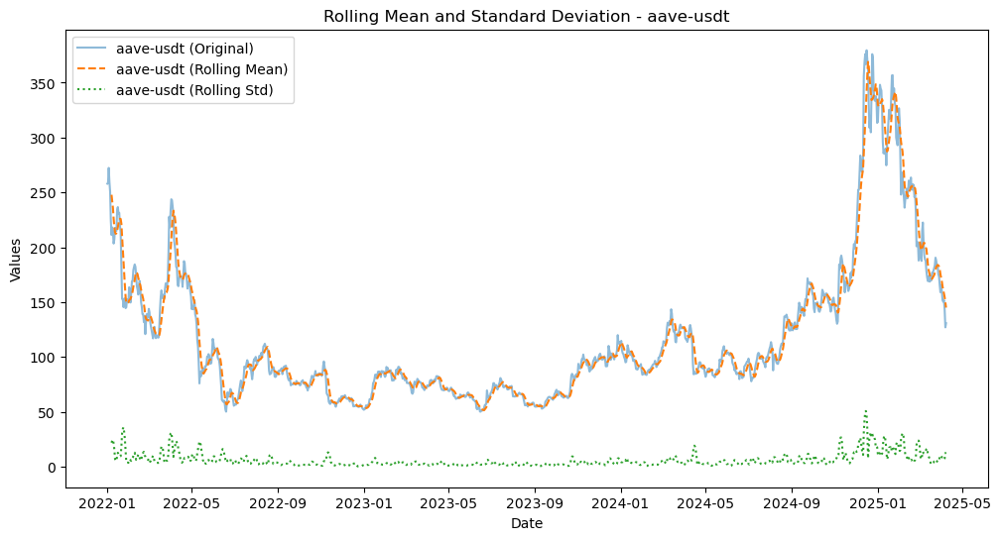

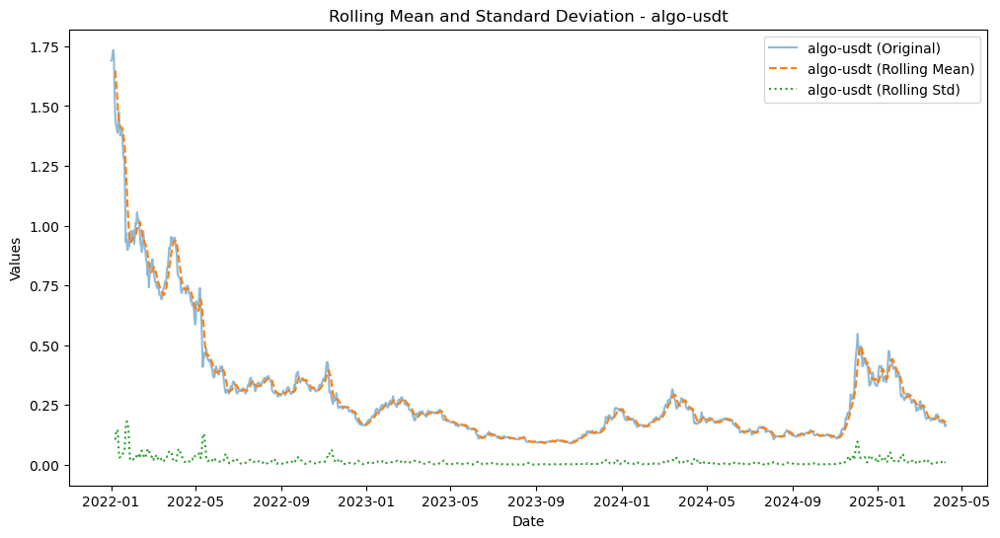

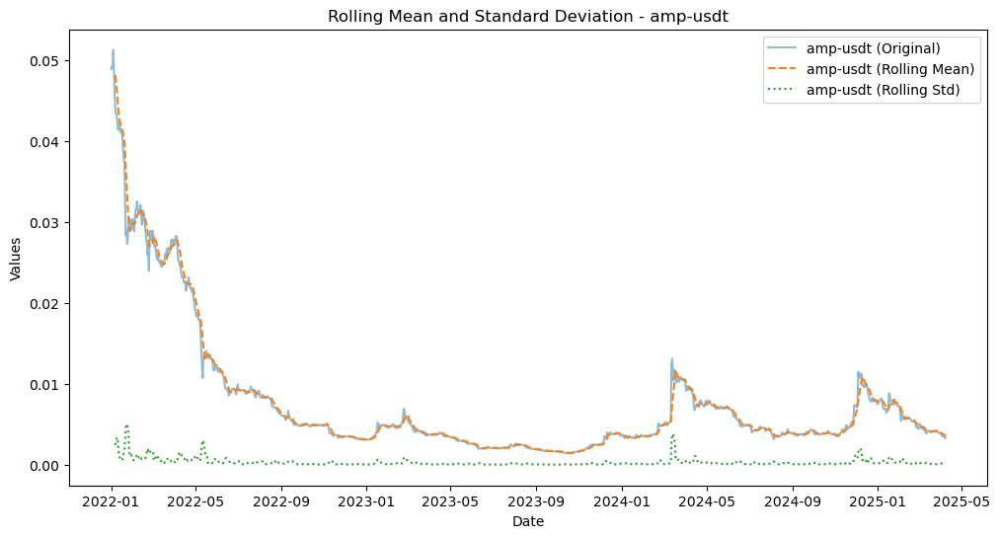

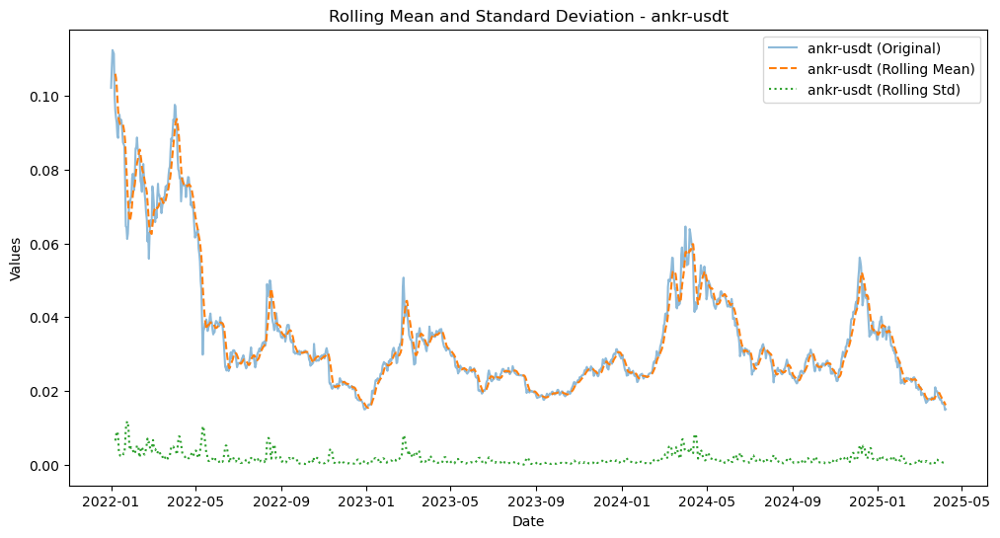

...

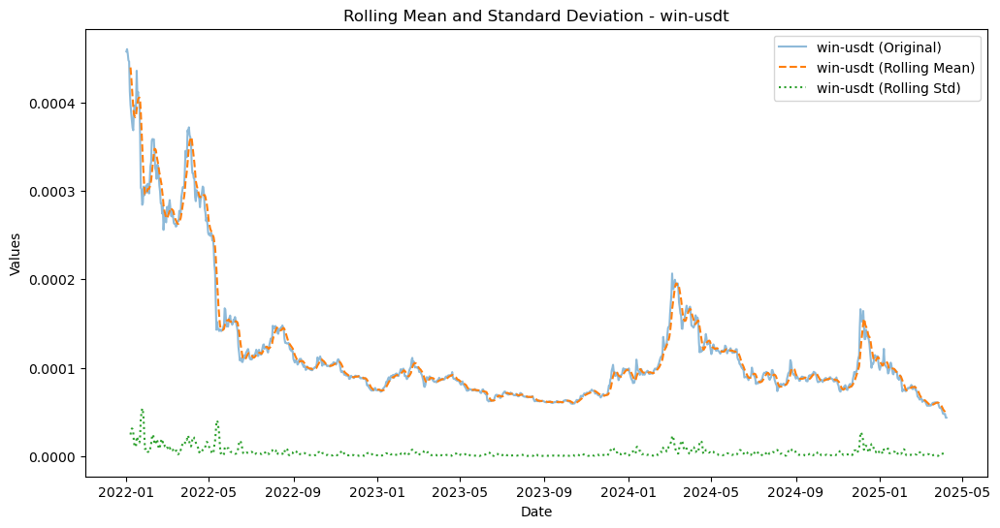

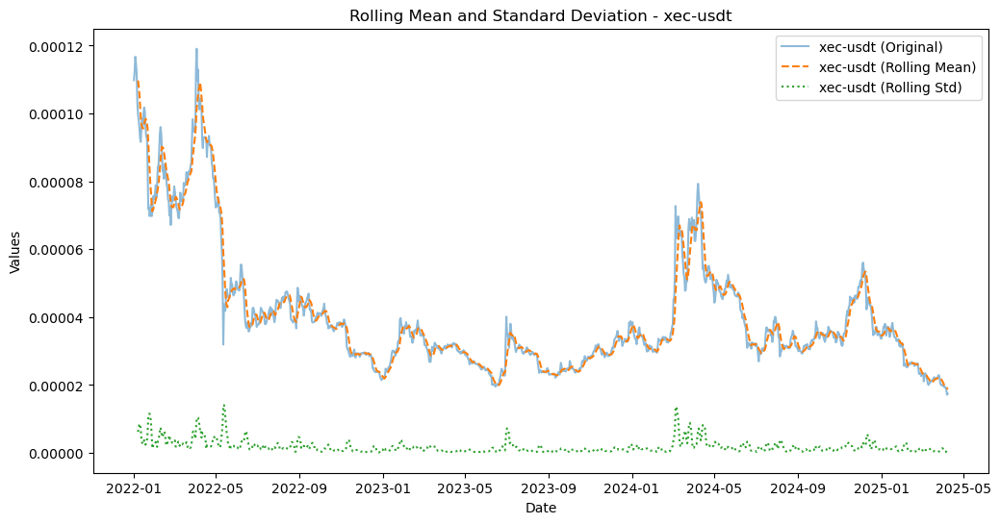

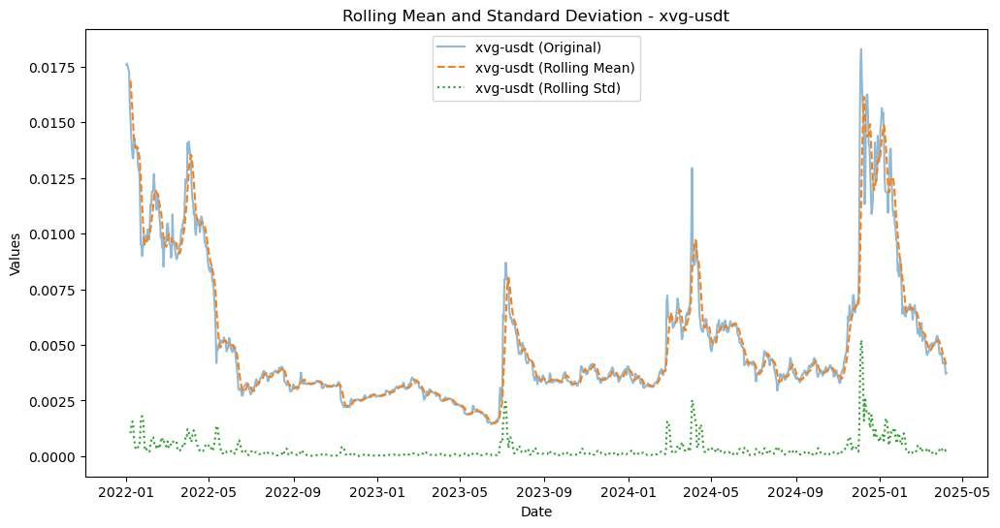

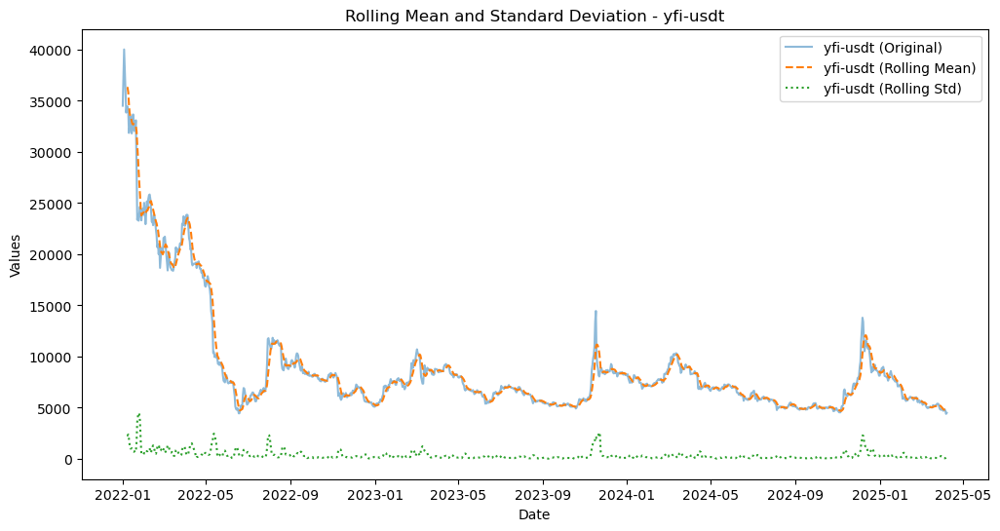

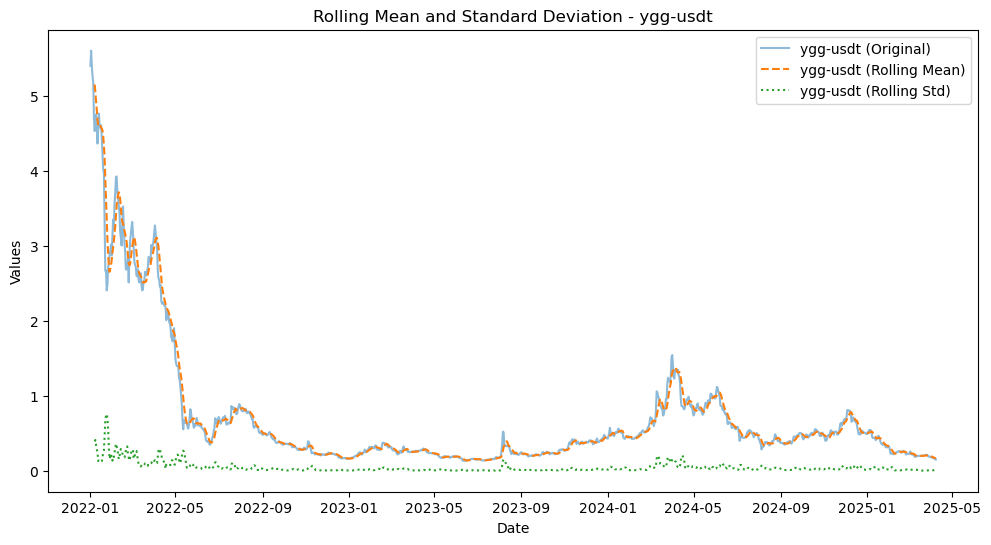

In [20]:
# Rolling Mean and Standard Deviation for Resampled Data - Separate Plots
for column in data_daily.columns:
    plt.figure(figsize=(12, 6))
    rolling_mean = data_daily[column].rolling(window=7).mean()
    rolling_std = data_daily[column].rolling(window=7).std()
    
    plt.plot(data_daily[column], label=f"{column} (Original)", alpha=0.5)
    plt.plot(rolling_mean, label=f"{column} (Rolling Mean)", linestyle="--")
    plt.plot(rolling_std, label=f"{column} (Rolling Std)", linestyle=":")
    
    plt.title(f"Rolling Mean and Standard Deviation - {column}")
    plt.xlabel("Date")
    plt.ylabel("Values")
    plt.legend()
    plt.show()


In [37]:
# this is our ohcl data
data = pd.read_parquet('binance_1h_ohlcv_2023-2025.parquet')

In [38]:
data.head()

,datetime,open_1inch-usdt,open_aave-usdt,open_ach-usdt,open_ada-usdt,open_akro-usdt,open_algo-usdt,open_amp-usdt,open_ankr-usdt,open_ape-usdt,...,volume_wing-usdt,volume_woo-usdt,volume_xec-usdt,volume_xrp-usdt,volume_xvg-usdt,volume_yfi-usdt,volume_yfii-usdt,volume_ygg-usdt,volume_zec-usdt,volume_zrx-usdt
0,2023-01-01 00:00:00,0.383,52.0,0.00780,0.2458,0.00303,0.1725,0.00305,0.01535,3.636,...,1350.87,216361.5,1.338965e+09,11231966.0,306448.0,15.08445,12.4876,48403.4,527.123,167485.0
1,2023-01-01 01:00:00,0.382,51.8,0.00774,0.2446,0.00303,0.1715,0.00305,0.01533,3.620,...,446.93,116588.6,1.388112e+09,6013573.0,195568.0,3.14928,14.1337,87053.9,1328.673,22863.0
2,2023-01-01 02:00:00,0.384,51.9,0.00774,0.2452,0.00302,0.1718,0.00304,0.01532,3.632,...,301.16,877513.8,3.642007e+08,6860256.0,90395.0,3.09037,16.8438,149015.0,1083.789,56707.0
3,2023-01-01 03:00:00,0.384,51.9,0.00778,0.2456,0.00303,0.1715,0.00305,0.01541,3.639,...,2009.07,286559.5,6.342589e+08,3024733.0,142658.0,2.34794,29.3838,15423.0,348.333,243078.0
4,2023-01-01 04:00:00,0.384,51.7,0.00779,0.2454,0.00302,0.1731,0.00304,0.01540,3.637,...,369.85,90040.7,5.338429e+08,5002481.0,473194.0,2.61242,17.2952,26154.6,732.394,110919.0


Now let's check if there is any tendency in the candles (bullish-bearish) 

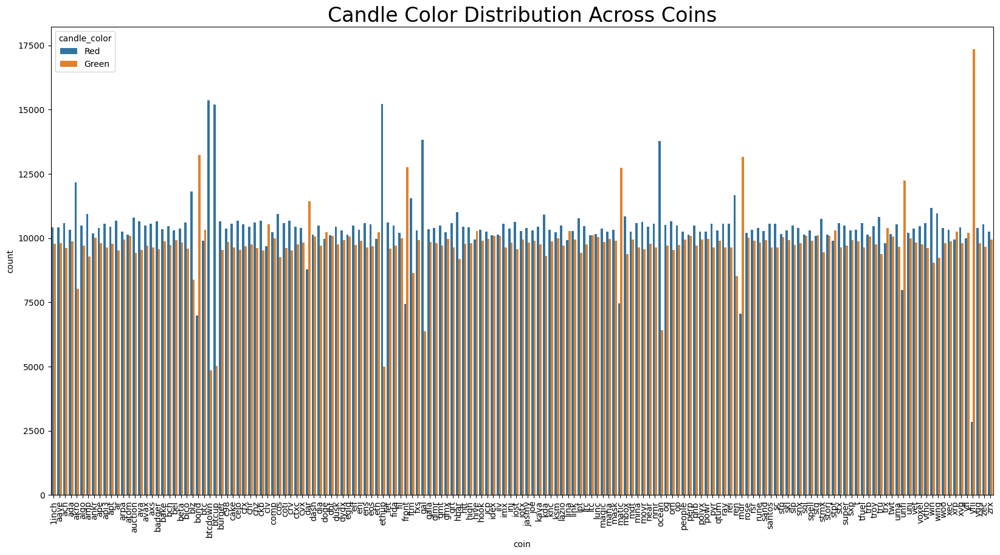

In [41]:
coins = [col.replace('open_', '').replace('-usdt', '') for col in data.columns if col.startswith('open_')]


candle_data = []

for coin in coins:
    open_col = f'open_{coin}-usdt'
    close_col = f'close_{coin}-usdt'
    
    if open_col in data.columns and close_col in data.columns:
        colors = data.apply(lambda row: 'Green' if row[close_col] > row[open_col] else 'Red', axis=1)
        
        # Create a mini dataframe and append
        temp_df = pd.DataFrame({
            'coin': coin,
            'candle_color': colors
        })
        candle_data.append(temp_df)

candle_df = pd.concat(candle_data)

plt.figure(figsize=(20,10))
sns.countplot(x='coin', hue='candle_color', data=candle_df)
plt.title('Candle Color Distribution Across Coins', fontsize=24)
plt.xticks(rotation=90)
plt.show()

In [42]:
coins = [col.replace('high_', '').replace('-usdt', '') for col in data.columns if col.startswith('high_')]

range_data = []

for coin in coins:
    high_col = f'high_{coin}-usdt'
    low_col = f'low_{coin}-usdt'
    
    if high_col in data.columns and low_col in data.columns:
        # Calculate range for this coin
        coin_range = data[high_col] - data[low_col]
        
        # Create mini dataframe
        temp_df = pd.DataFrame({
            'coin': coin,
            'range': coin_range
        })
        
        range_data.append(temp_df)

range_df = pd.concat(range_data)

In [47]:
def feature_normalize(dataset):
    mu = np.mean(dataset,axis = 0)
    sigma = np.std(dataset,axis = 0)
    return (dataset - mu)/sigma

In [48]:
data_norm = feature_normalize(data)

In [49]:
coins = [col.replace('high_', '').replace('-usdt', '') for col in data_norm.columns if col.startswith('high_')]
range_data = []

for coin in coins:
    high_col = f'high_{coin}-usdt'
    low_col = f'low_{coin}-usdt'
    
    if high_col in data_norm.columns and low_col in data_norm.columns:
        price_range = data_norm[high_col] - data_norm[low_col]
        temp_df = pd.DataFrame({
            'coin': coin,
            'range': price_range
        })
        range_data.append(temp_df)


range_df = pd.concat(range_data)

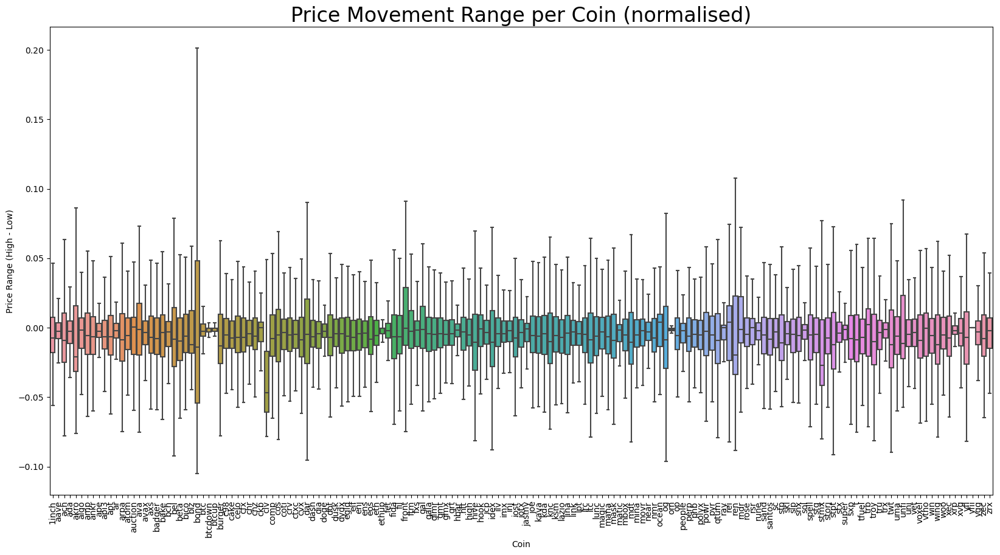

In [51]:
plt.figure(figsize=(20,10))
sns.boxplot(x='coin', y='range', data=range_df, showfliers=False)
plt.title('Price Movement Range per Coin (normalised)', fontsize=24)
plt.xticks(rotation=90)
plt.xlabel('Coin')
plt.ylabel('Price Range (High - Low)')
plt.show()

Lets see in a year over year basis

In [55]:
data['datetime'] = pd.to_datetime(data['datetime'])
data['year'] = data['datetime'].dt.year 

coins = [col.replace('high_', '').replace('-usdt', '') for col in data.columns if col.startswith('high_')]

range_data = []

for coin in coins:
    high_col = f'high_{coin}-usdt'
    low_col = f'low_{coin}-usdt'
    open_col = f'open_{coin}-usdt'
    
    if high_col in data.columns and low_col in data.columns and open_col in data.columns:
        price_range = (data[high_col] - data[low_col]) / data[open_col]  # normalized range
        temp_df = pd.DataFrame({
            'coin': coin,
            'year': data['year'],
            'range': price_range
        })
        range_data.append(temp_df)

range_df = pd.concat(range_data)

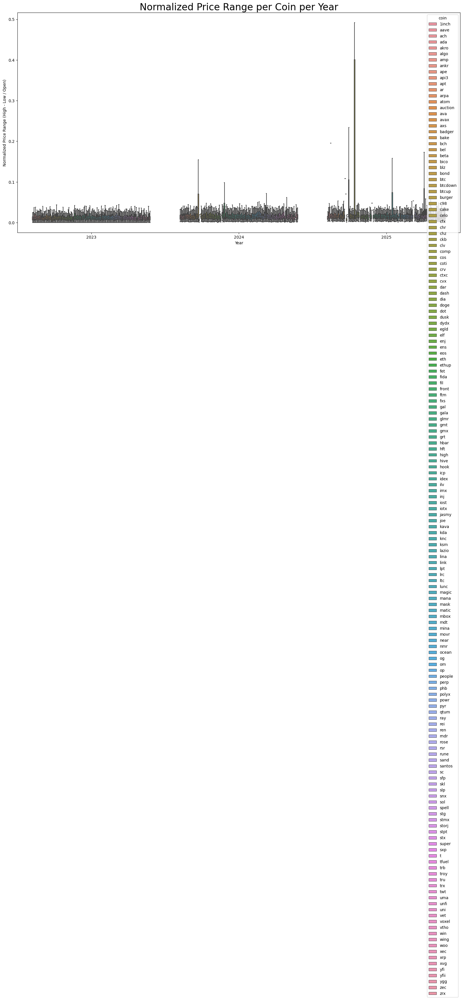

In [57]:
plt.figure(figsize=(20,10))
sns.boxplot(x='year', y='range', hue='coin', data=range_df, showfliers=False)
plt.title('Normalized Price Range per Coin per Year', fontsize=24)
plt.xlabel('Year')
plt.ylabel('Normalized Price Range (High - Low / Open)')
#plt.legend(title='Coin', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [62]:
volume_columns = [col for col in data.columns if col.startswith('volume_')]

volume_data = []

for col in volume_columns:
    coin = col.replace('volume_', '').replace('-usdt', '')
    temp_df = pd.DataFrame({
        'coin': coin,
        'volume': data[col]
    })
    volume_data.append(temp_df)


volume_df = pd.concat(volume_data)

In [ ]:
#histogram is not a good idea
# plt.figure(figsize=(16,8))
# sns.histplot(volume_df['volume'], bins=50, kde=True)
# plt.title('Volume Distribution Across All Coins', fontsize=24)
# plt.xlabel('Volume')
# plt.ylabel('Frequency')
# plt.show()

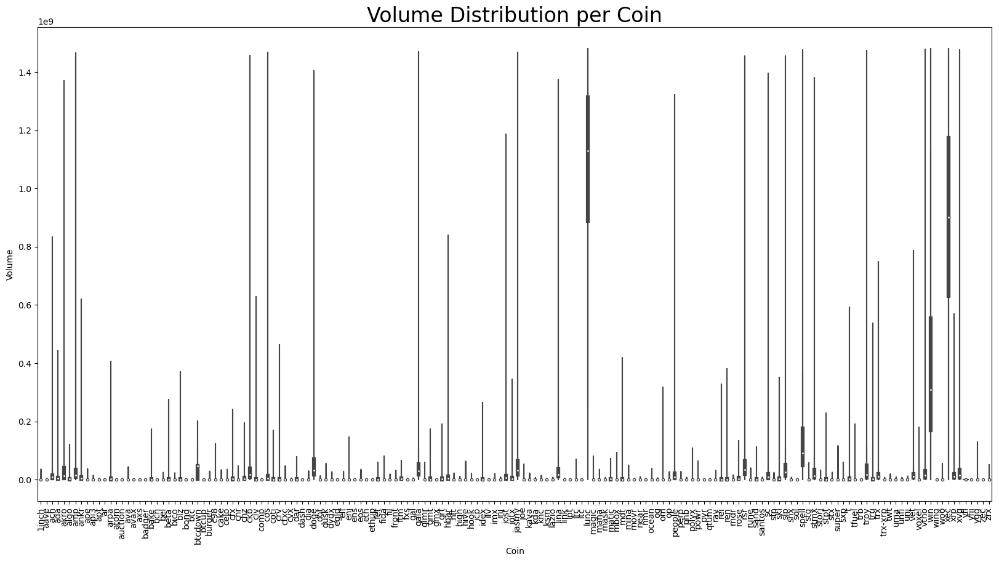

In [60]:
plt.figure(figsize=(20,10))
sns.violinplot(x='coin', y='volume', data=volume_df, cut=0)
plt.title('Volume Distribution per Coin', fontsize=24)
plt.xticks(rotation=90)
plt.xlabel('Coin')
plt.ylabel('Volume')
plt.show()

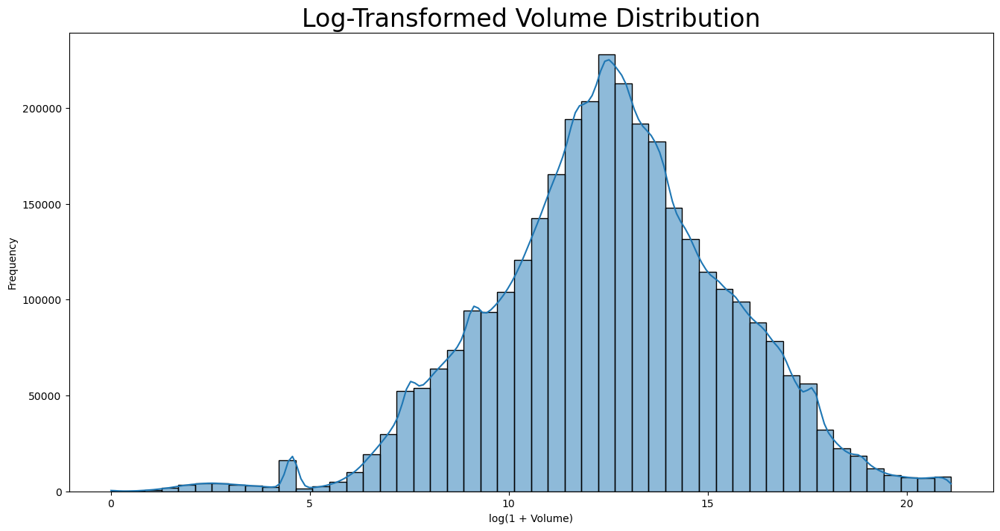

In [61]:
volume_df['log_volume'] = np.log1p(volume_df['volume'])

plt.figure(figsize=(16,8))
sns.histplot(volume_df['log_volume'], bins=50, kde=True)
plt.title('Log-Transformed Volume Distribution', fontsize=24)
plt.xlabel('log(1 + Volume)')
plt.ylabel('Frequency')
plt.show()


In [65]:
close_columns = [col for col in data_norm.columns if col.startswith('close_')]
close_data = []

for col in close_columns:
    coin = col.replace('close_', '').replace('-usdt', '')
    temp_df = pd.DataFrame({
        'coin': coin,
        'close_price': data_norm[col]
    })
    close_data.append(temp_df)

close_df = pd.concat(close_data)

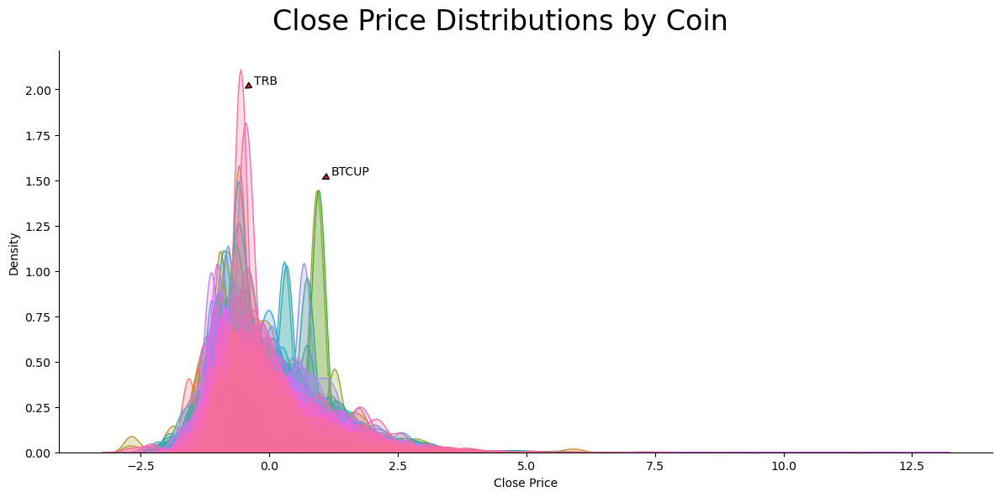

In [73]:
sns.set_palette("Set1", desat=1)

facetgrid = sns.FacetGrid(close_df, hue='coin', height=6, aspect=2)
facetgrid.map(sns.kdeplot, 'close_price', fill=True)
#facetgrid.add_legend()

# Title and labels
facetgrid.fig.suptitle('Close Price Distributions by Coin', fontsize=24)
facetgrid.set_axis_labels('Close Price', 'Density')
facetgrid.set_titles('{col_name}')


plt.annotate("TRB", xy=(-0.5, 2), xytext=(-0.3, 2.05),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("BTCUP", xy=(1, 1.5), xytext=(1.2, 1.55),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

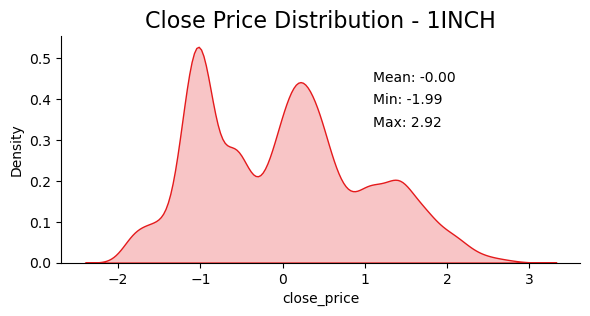

<Figure size 1000x600 with 0 Axes>

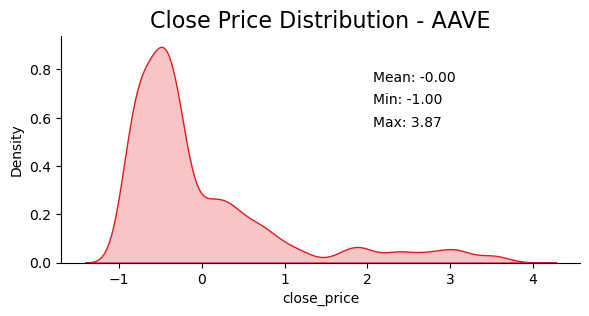

<Figure size 1000x600 with 0 Axes>

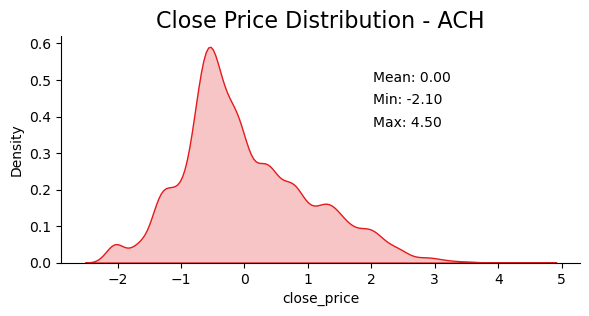

<Figure size 1000x600 with 0 Axes>

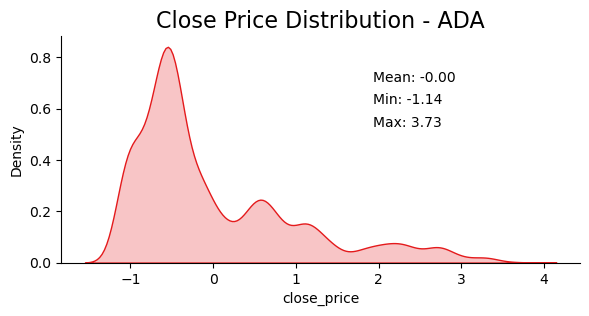

<Figure size 1000x600 with 0 Axes>

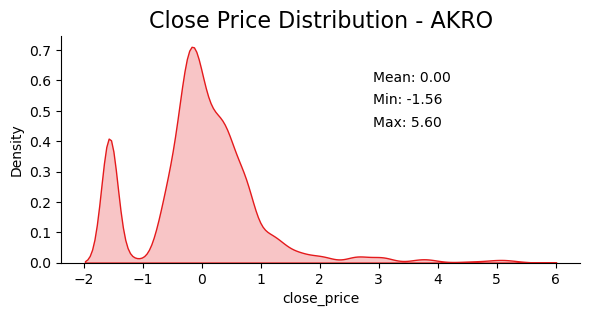

<Figure size 1000x600 with 0 Axes>

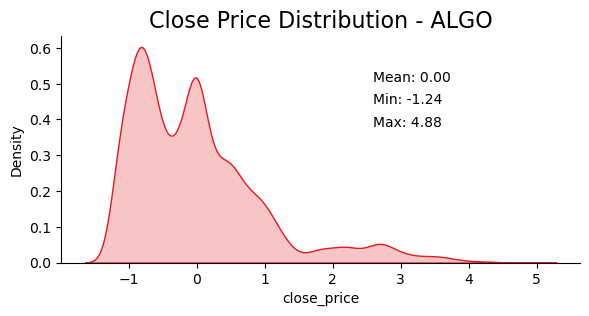

<Figure size 1000x600 with 0 Axes>

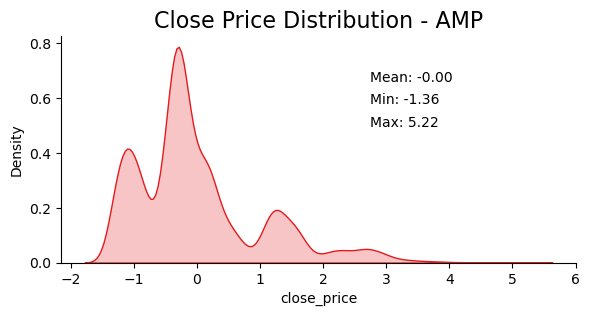

<Figure size 1000x600 with 0 Axes>

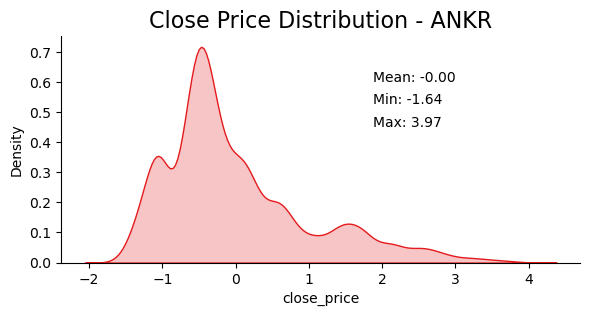

<Figure size 1000x600 with 0 Axes>

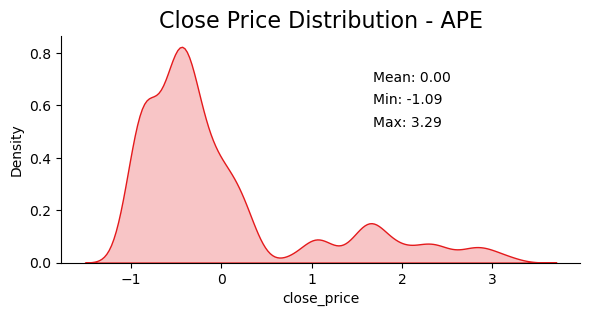

<Figure size 1000x600 with 0 Axes>

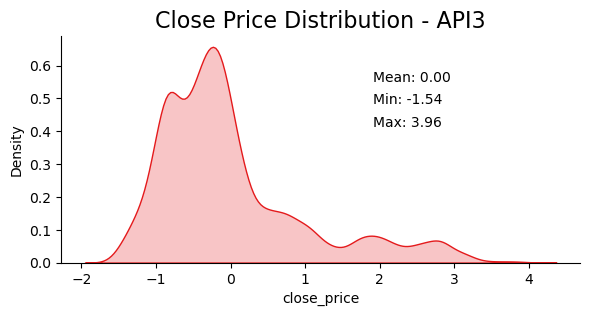

<Figure size 1000x600 with 0 Axes>

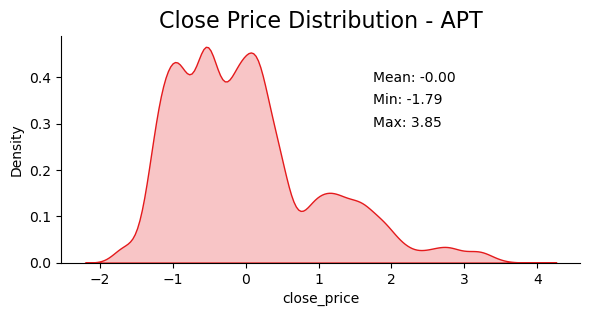

<Figure size 1000x600 with 0 Axes>

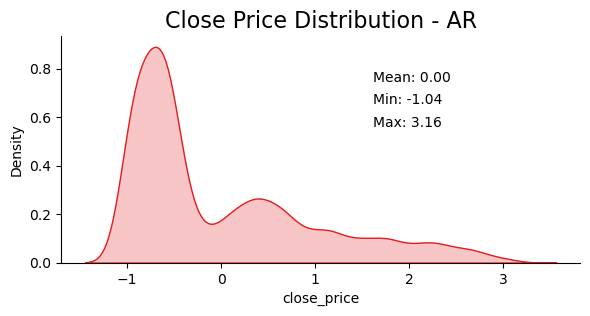

<Figure size 1000x600 with 0 Axes>

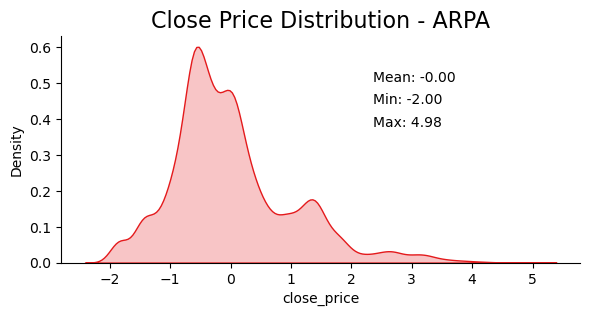

<Figure size 1000x600 with 0 Axes>

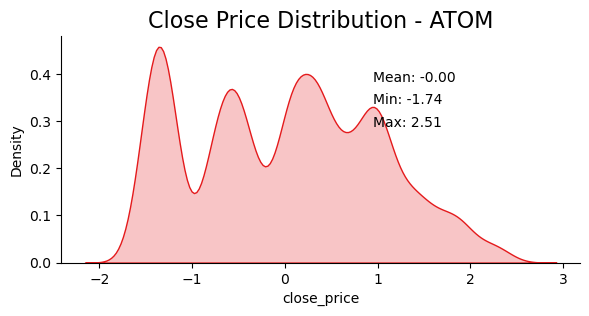

<Figure size 1000x600 with 0 Axes>

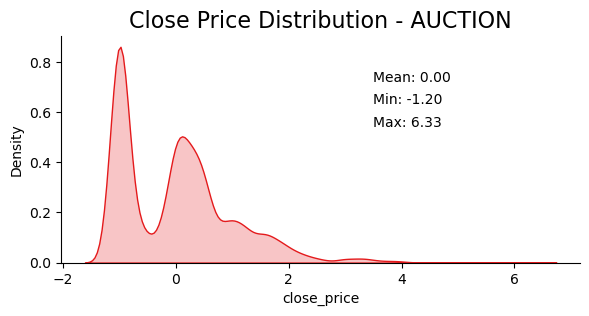

<Figure size 1000x600 with 0 Axes>

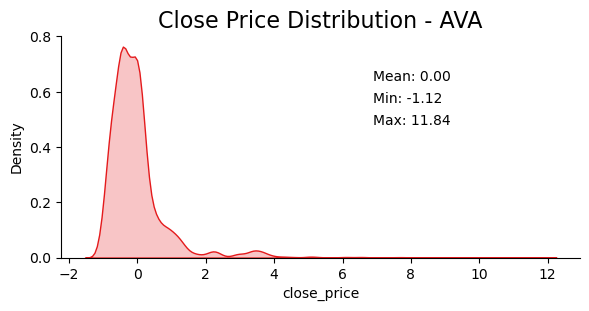

<Figure size 1000x600 with 0 Axes>

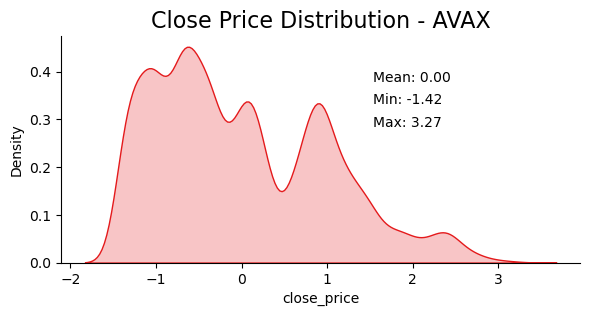

<Figure size 1000x600 with 0 Axes>

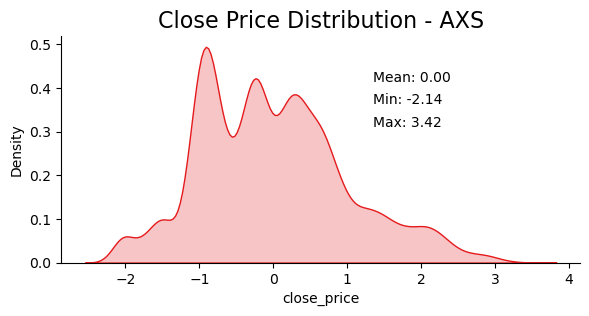

<Figure size 1000x600 with 0 Axes>

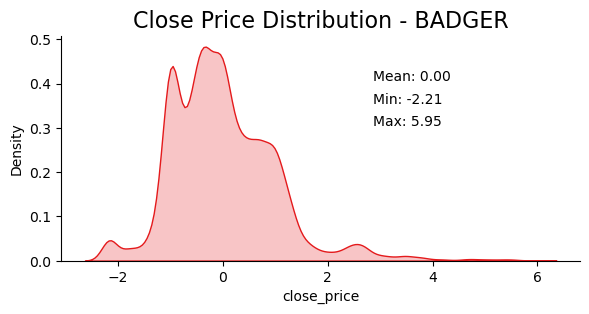

<Figure size 1000x600 with 0 Axes>

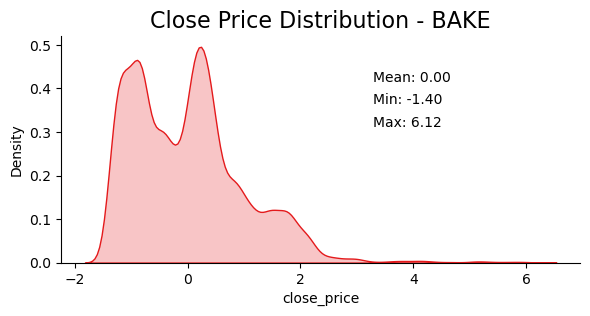

<Figure size 1000x600 with 0 Axes>

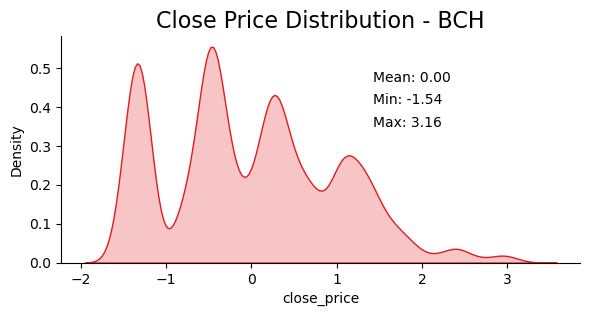

<Figure size 1000x600 with 0 Axes>

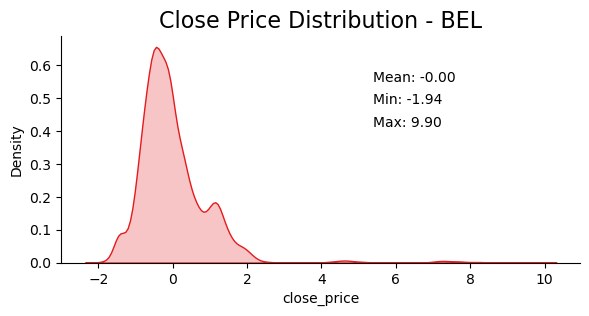

<Figure size 1000x600 with 0 Axes>

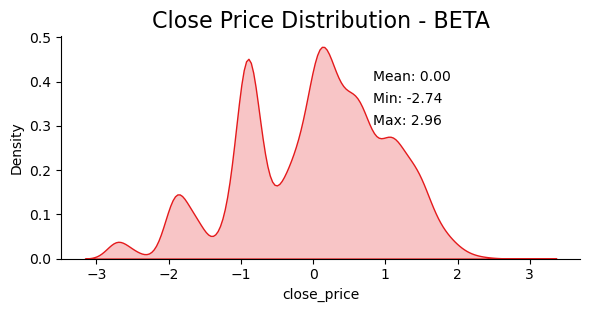

<Figure size 1000x600 with 0 Axes>

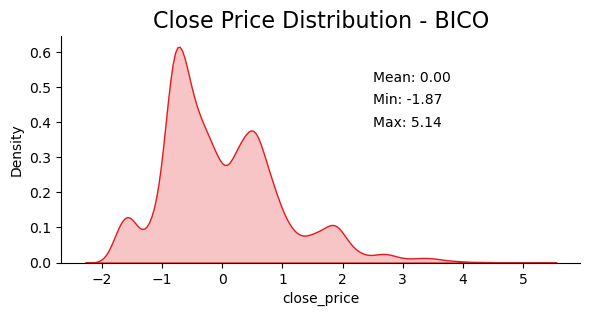

<Figure size 1000x600 with 0 Axes>

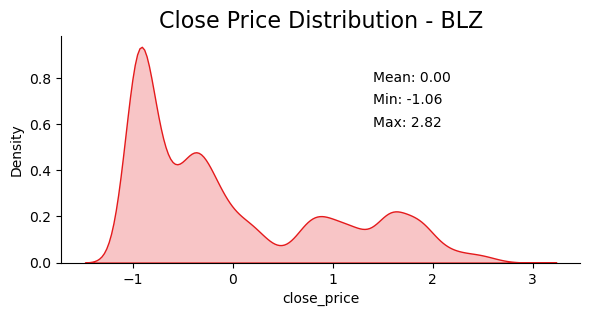

<Figure size 1000x600 with 0 Axes>

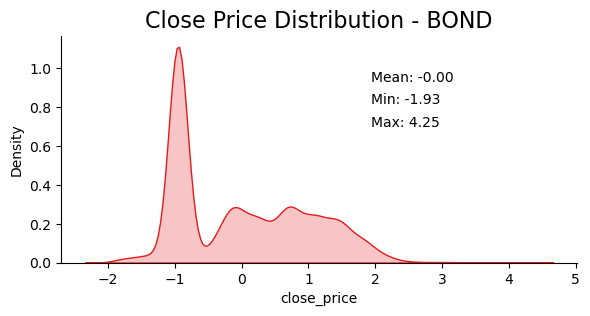

<Figure size 1000x600 with 0 Axes>

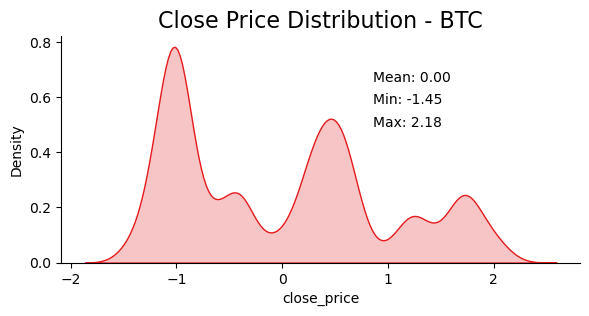

<Figure size 1000x600 with 0 Axes>

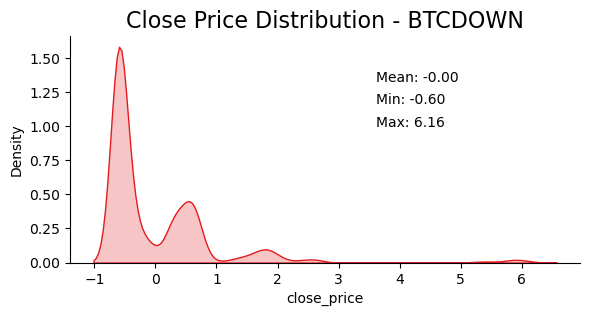

<Figure size 1000x600 with 0 Axes>

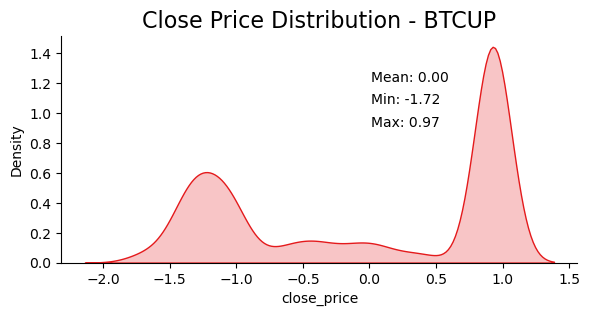

<Figure size 1000x600 with 0 Axes>

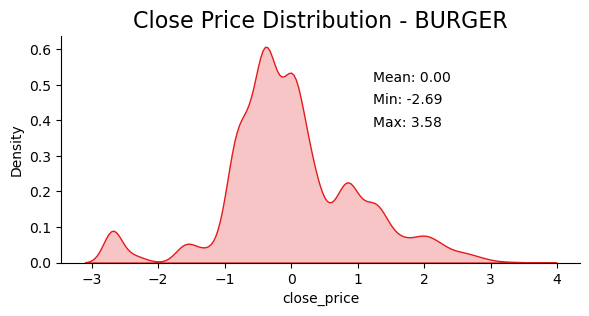

<Figure size 1000x600 with 0 Axes>

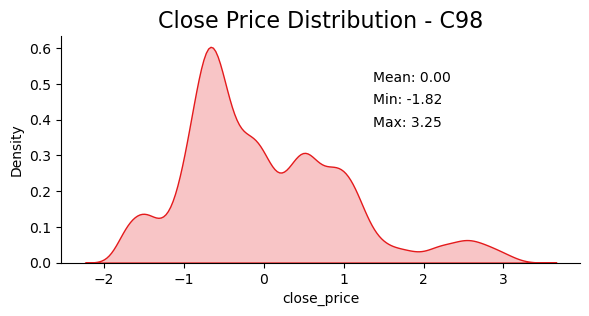

<Figure size 1000x600 with 0 Axes>

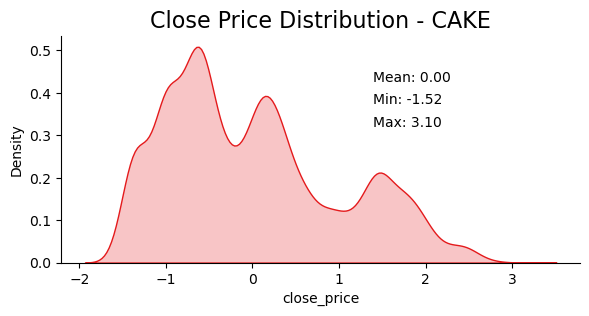

<Figure size 1000x600 with 0 Axes>

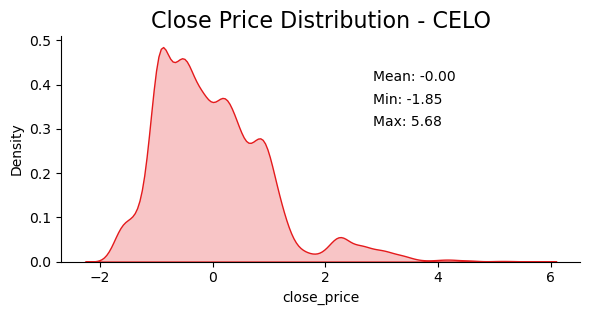

<Figure size 1000x600 with 0 Axes>

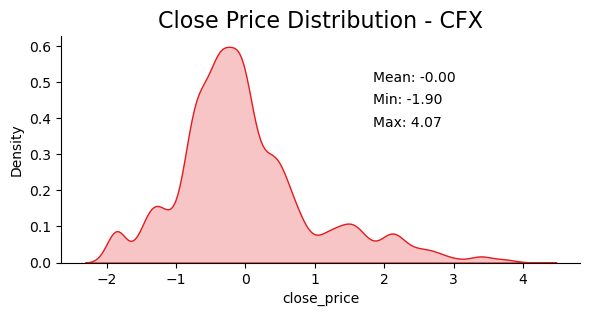

<Figure size 1000x600 with 0 Axes>

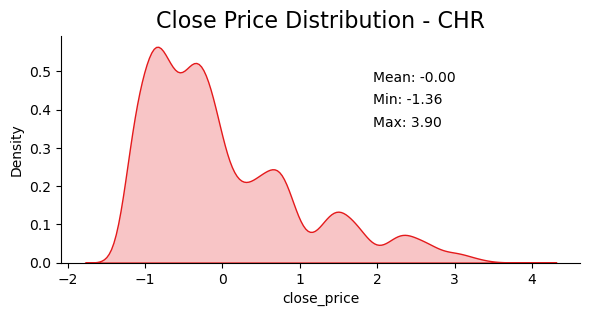

<Figure size 1000x600 with 0 Axes>

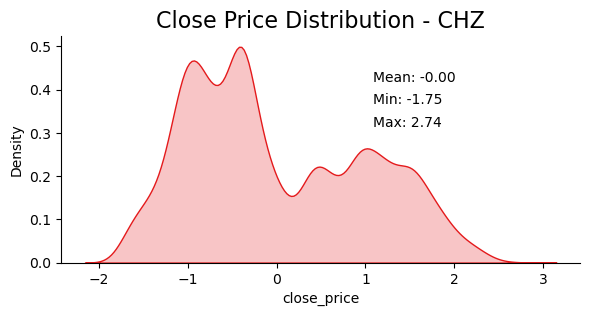

<Figure size 1000x600 with 0 Axes>

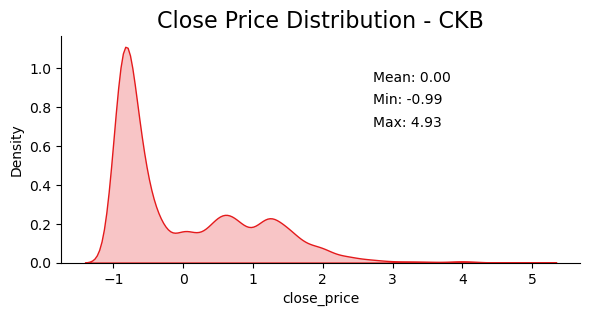

<Figure size 1000x600 with 0 Axes>

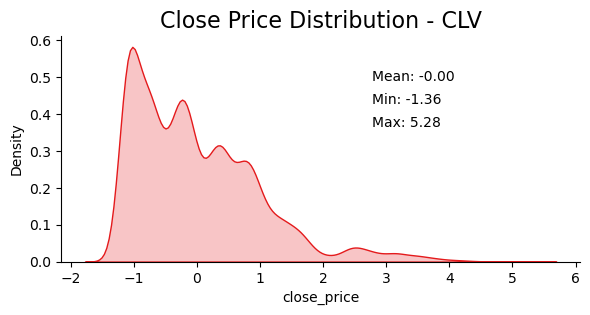

<Figure size 1000x600 with 0 Axes>

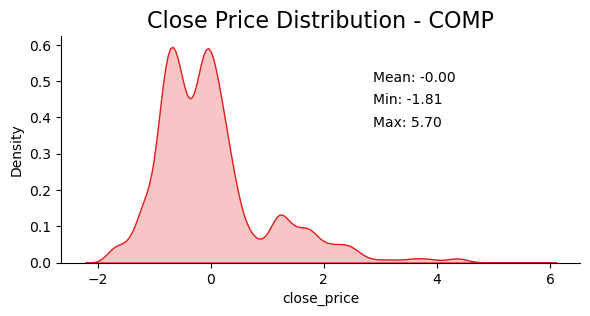

<Figure size 1000x600 with 0 Axes>

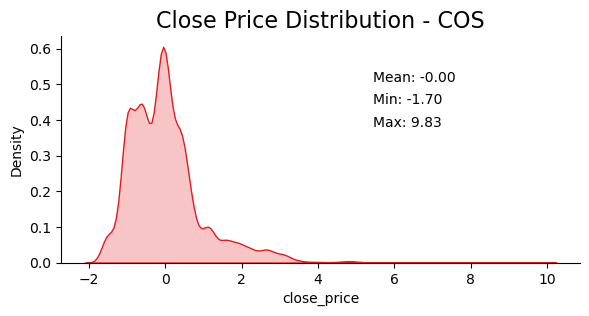

<Figure size 1000x600 with 0 Axes>

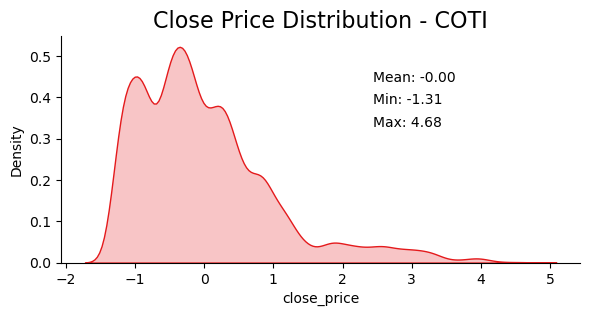

<Figure size 1000x600 with 0 Axes>

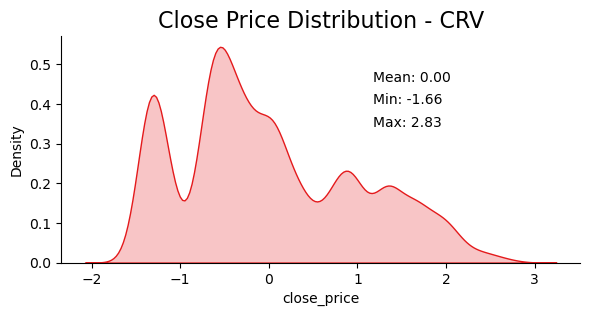

<Figure size 1000x600 with 0 Axes>

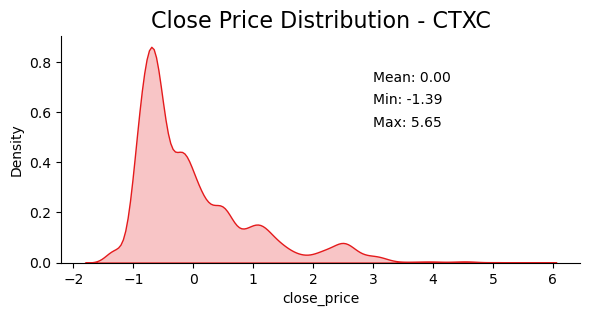

<Figure size 1000x600 with 0 Axes>

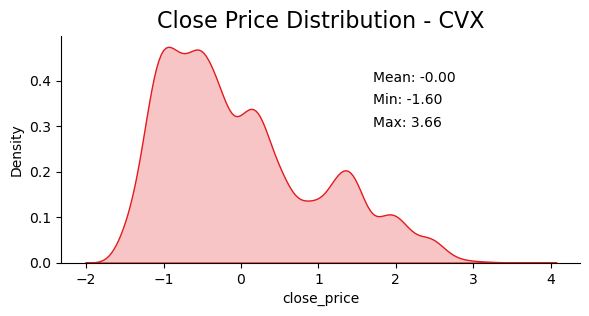

<Figure size 1000x600 with 0 Axes>

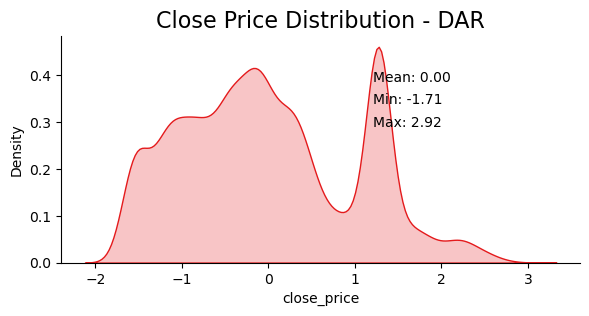

<Figure size 1000x600 with 0 Axes>

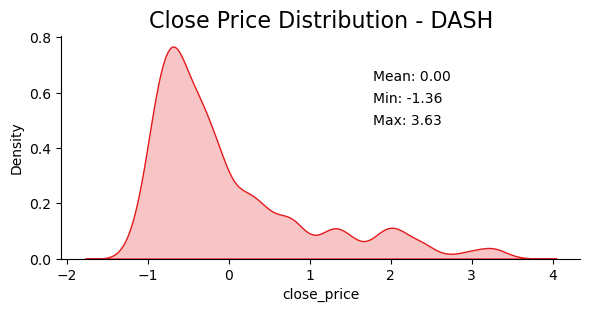

<Figure size 1000x600 with 0 Axes>

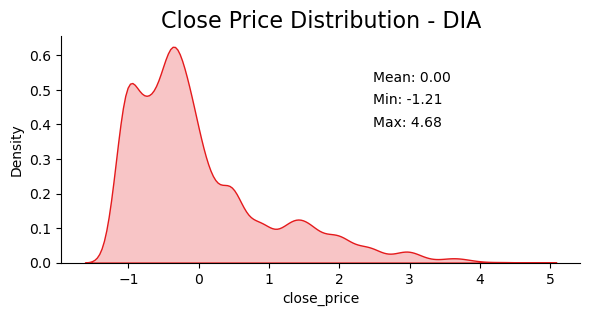

<Figure size 1000x600 with 0 Axes>

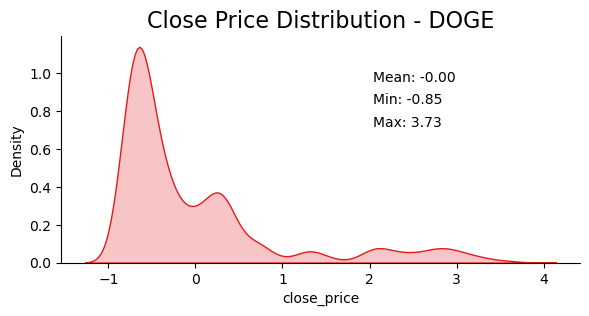

<Figure size 1000x600 with 0 Axes>

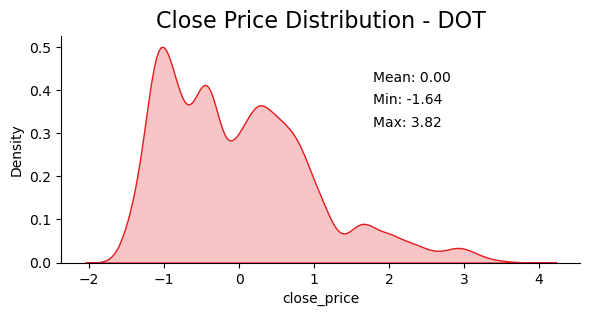

<Figure size 1000x600 with 0 Axes>

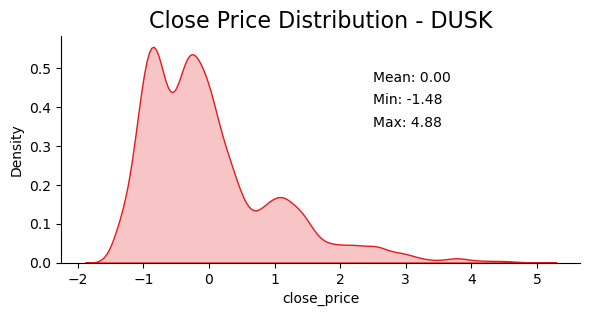

<Figure size 1000x600 with 0 Axes>

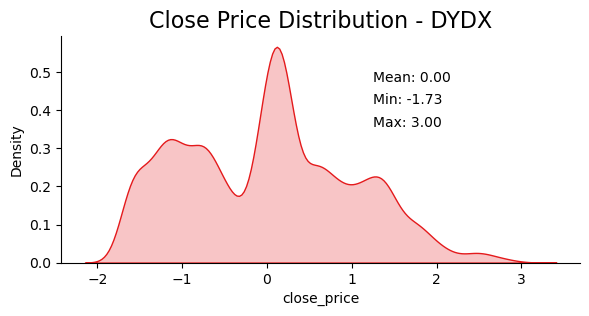

<Figure size 1000x600 with 0 Axes>

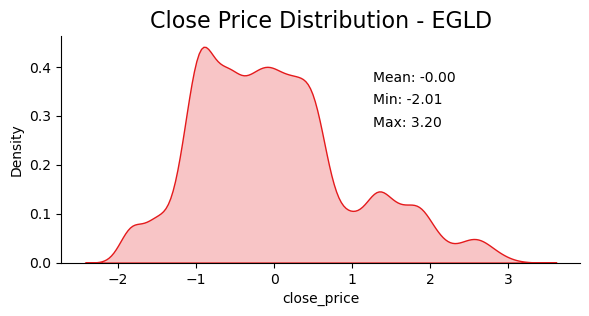

<Figure size 1000x600 with 0 Axes>

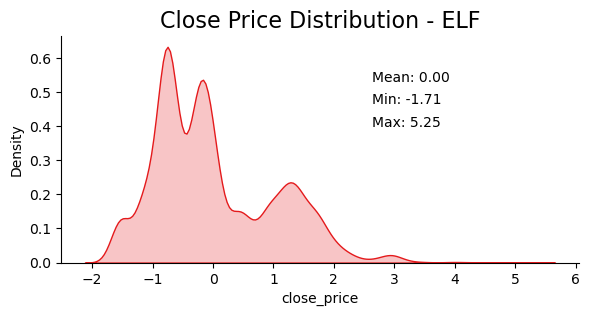

<Figure size 1000x600 with 0 Axes>

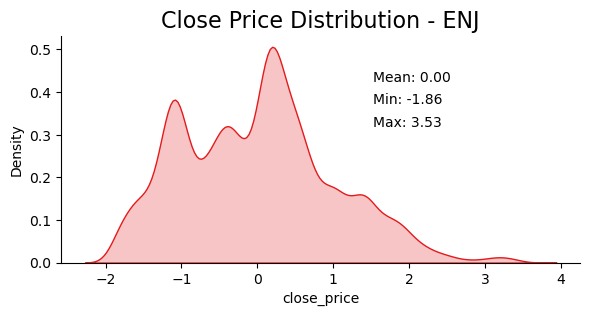

<Figure size 1000x600 with 0 Axes>

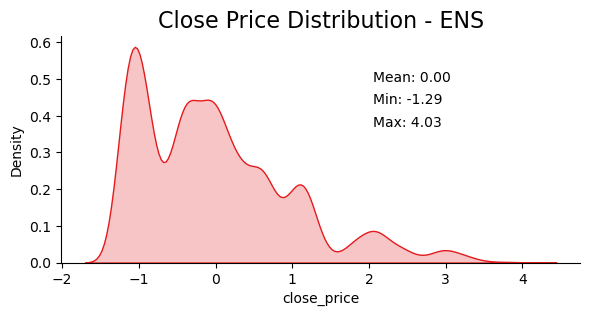

<Figure size 1000x600 with 0 Axes>

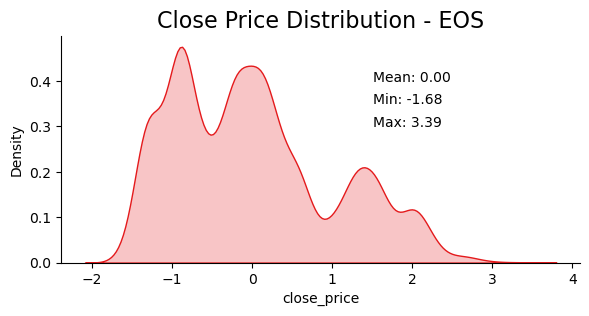

<Figure size 1000x600 with 0 Axes>

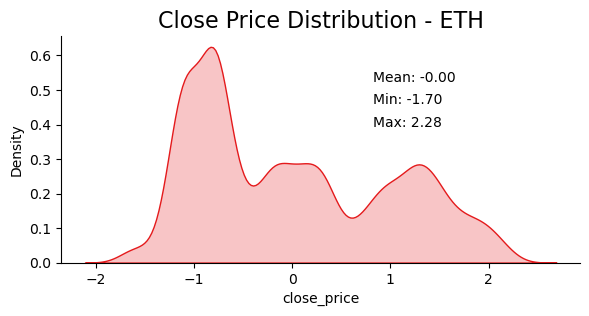

<Figure size 1000x600 with 0 Axes>

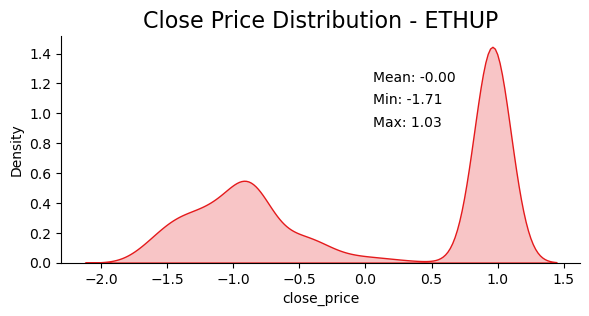

<Figure size 1000x600 with 0 Axes>

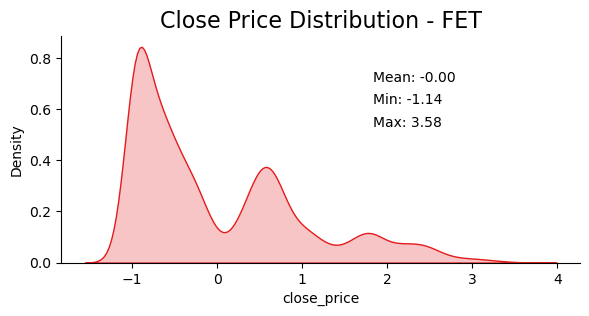

<Figure size 1000x600 with 0 Axes>

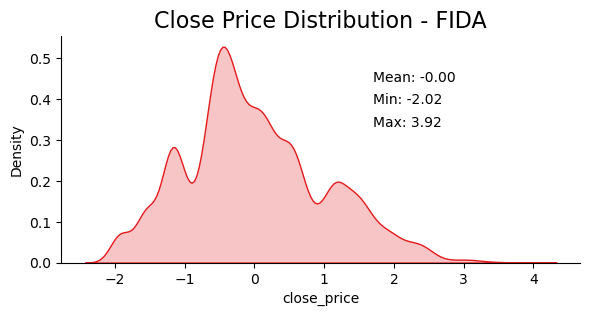

<Figure size 1000x600 with 0 Axes>

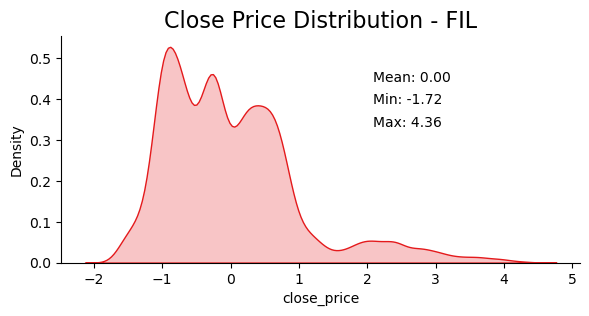

<Figure size 1000x600 with 0 Axes>

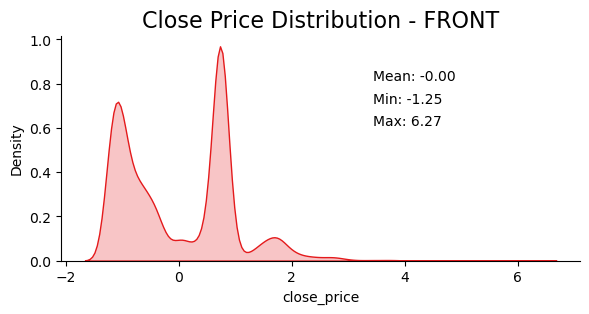

<Figure size 1000x600 with 0 Axes>

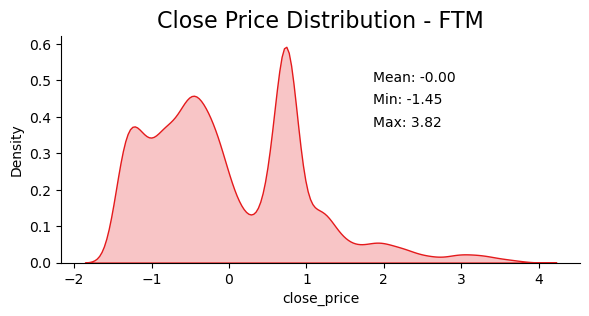

<Figure size 1000x600 with 0 Axes>

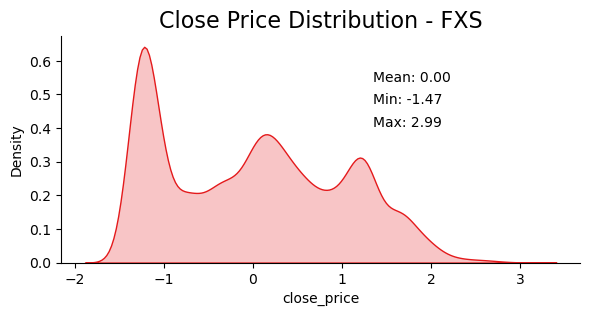

<Figure size 1000x600 with 0 Axes>

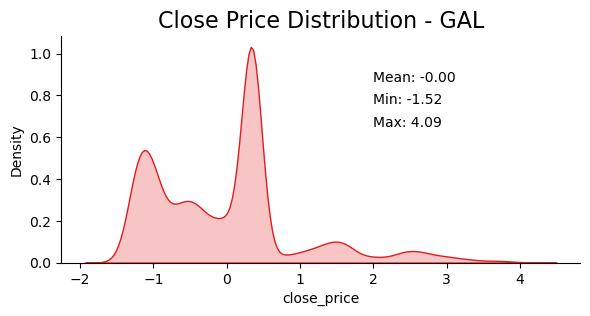

<Figure size 1000x600 with 0 Axes>

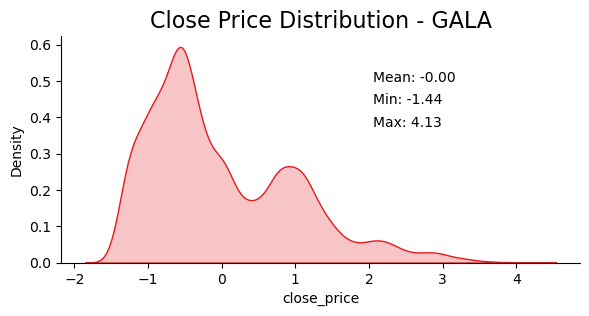

<Figure size 1000x600 with 0 Axes>

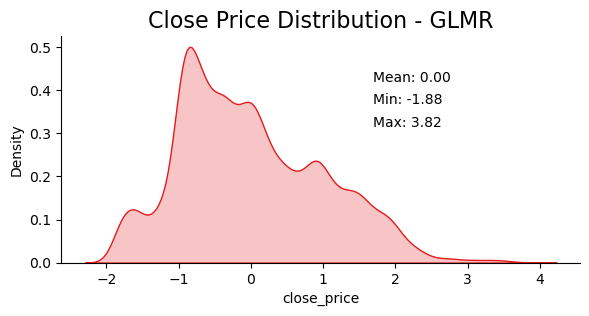

<Figure size 1000x600 with 0 Axes>

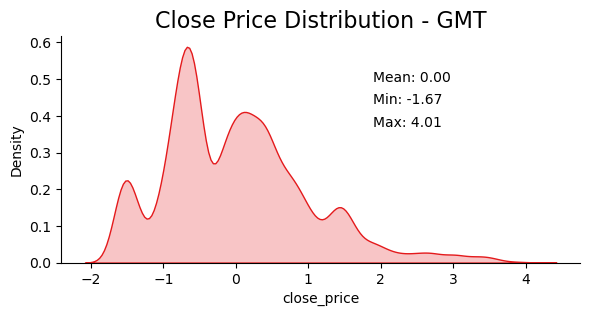

<Figure size 1000x600 with 0 Axes>

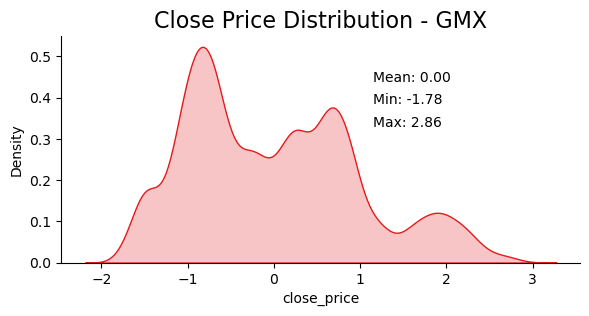

<Figure size 1000x600 with 0 Axes>

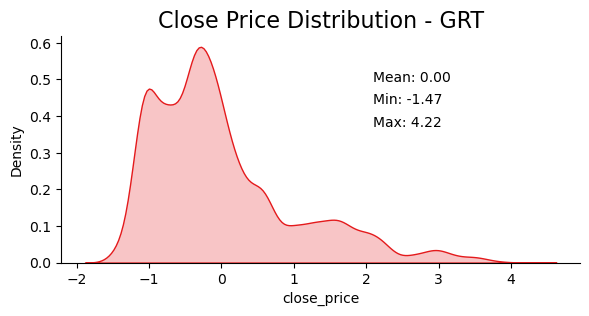

<Figure size 1000x600 with 0 Axes>

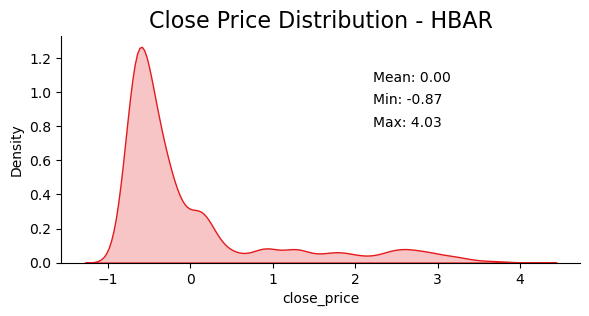

<Figure size 1000x600 with 0 Axes>

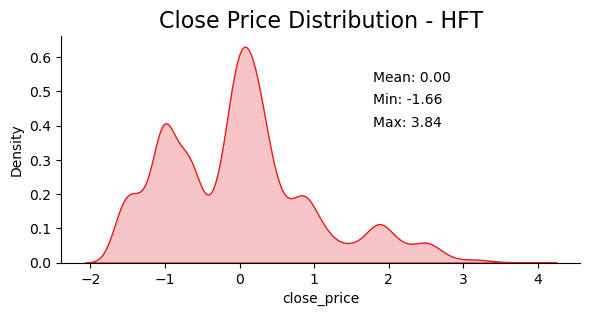

<Figure size 1000x600 with 0 Axes>

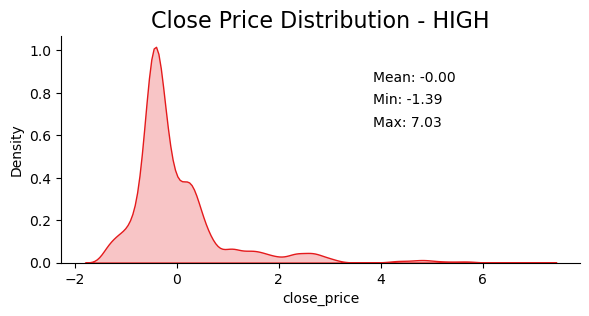

<Figure size 1000x600 with 0 Axes>

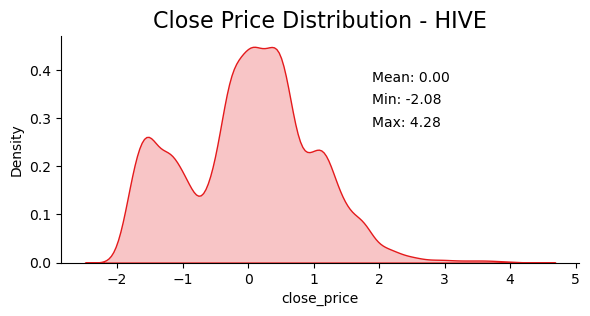

<Figure size 1000x600 with 0 Axes>

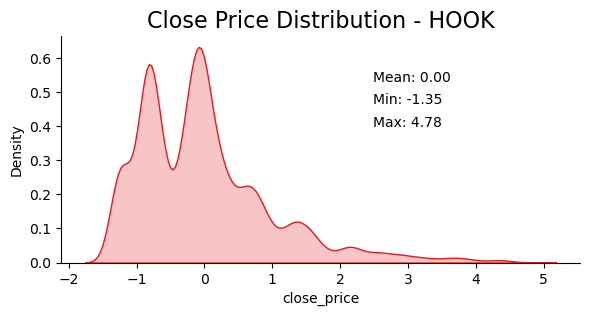

<Figure size 1000x600 with 0 Axes>

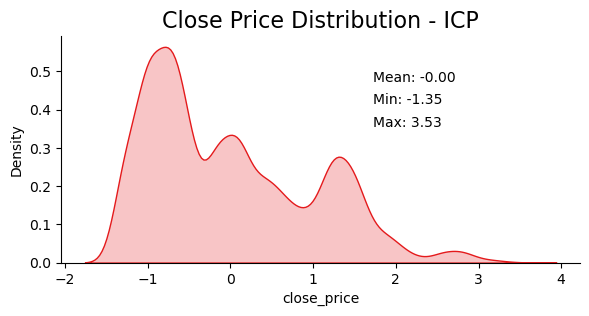

<Figure size 1000x600 with 0 Axes>

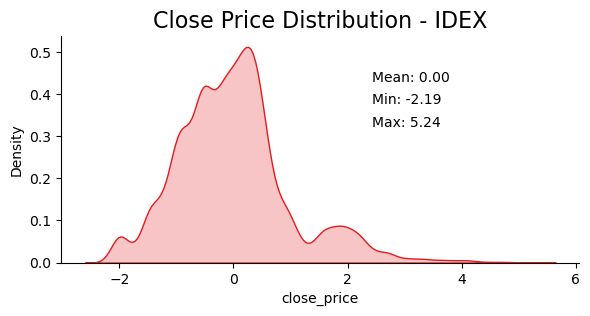

<Figure size 1000x600 with 0 Axes>

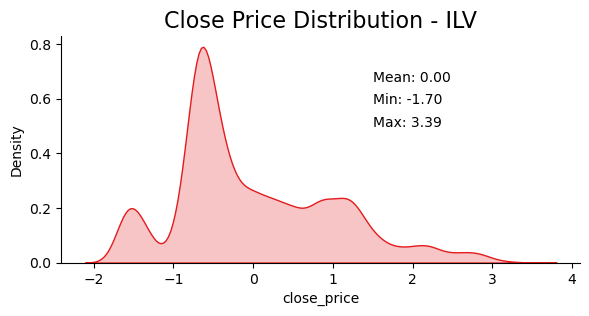

<Figure size 1000x600 with 0 Axes>

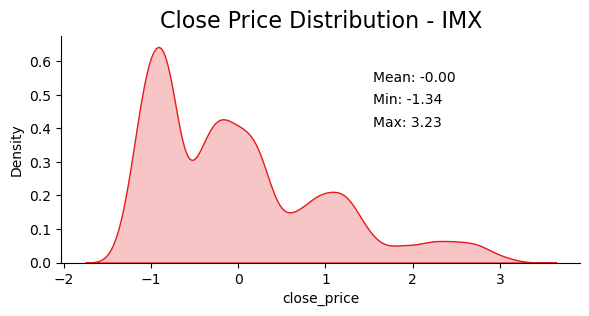

<Figure size 1000x600 with 0 Axes>

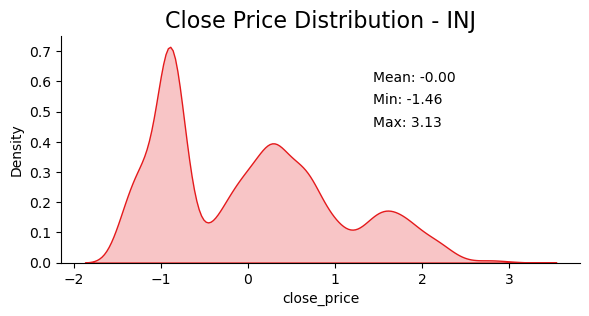

<Figure size 1000x600 with 0 Axes>

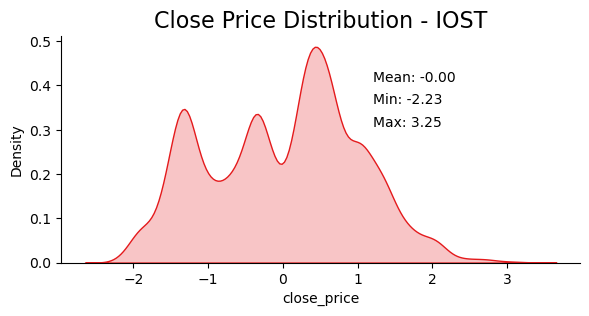

<Figure size 1000x600 with 0 Axes>

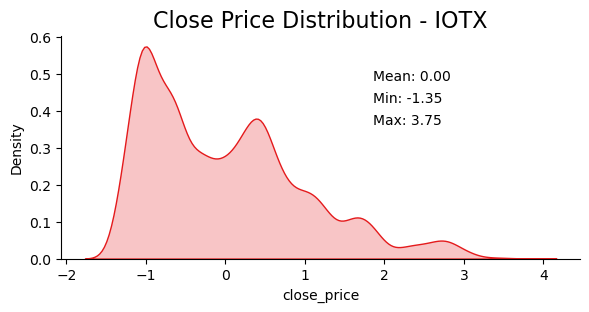

<Figure size 1000x600 with 0 Axes>

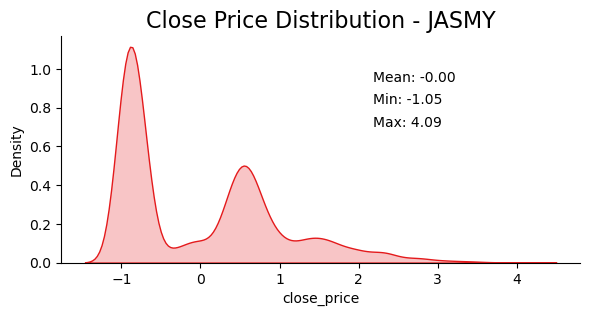

<Figure size 1000x600 with 0 Axes>

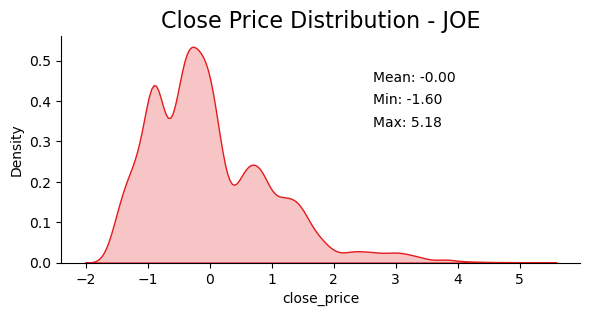

<Figure size 1000x600 with 0 Axes>

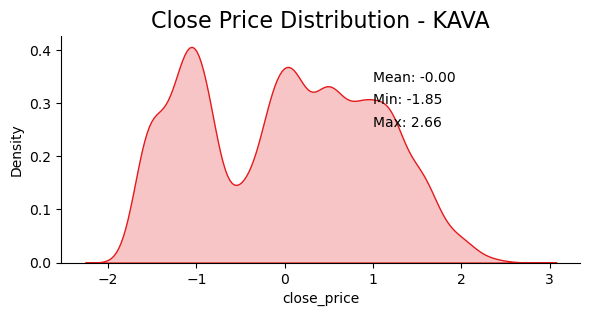

<Figure size 1000x600 with 0 Axes>

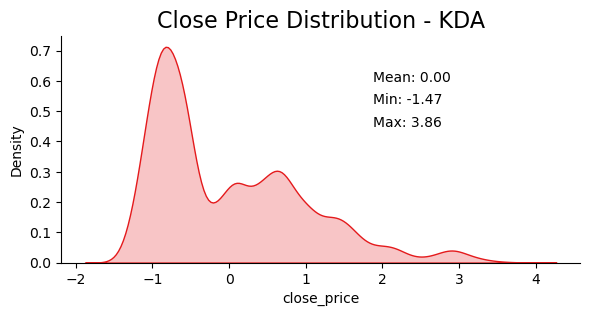

<Figure size 1000x600 with 0 Axes>

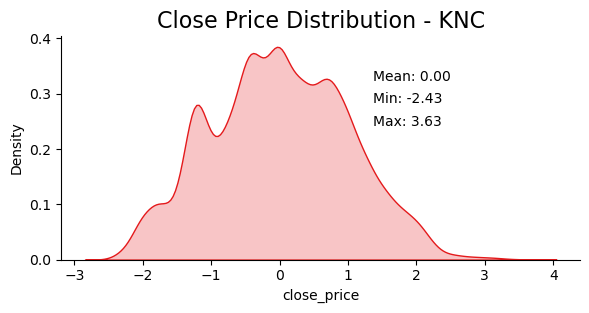

<Figure size 1000x600 with 0 Axes>

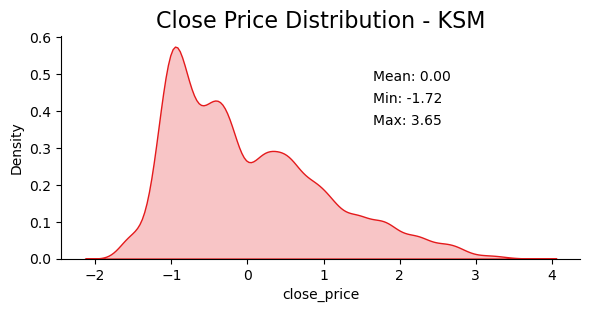

<Figure size 1000x600 with 0 Axes>

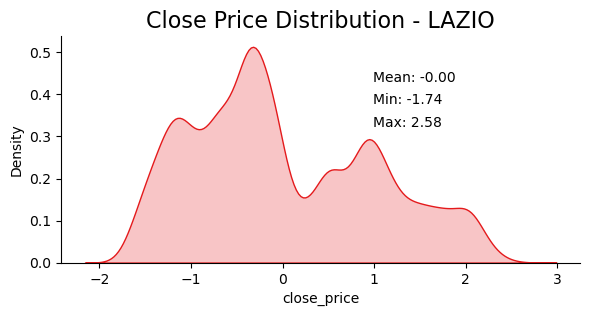

<Figure size 1000x600 with 0 Axes>

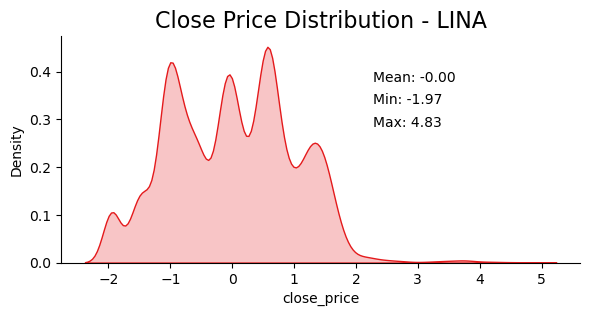

<Figure size 1000x600 with 0 Axes>

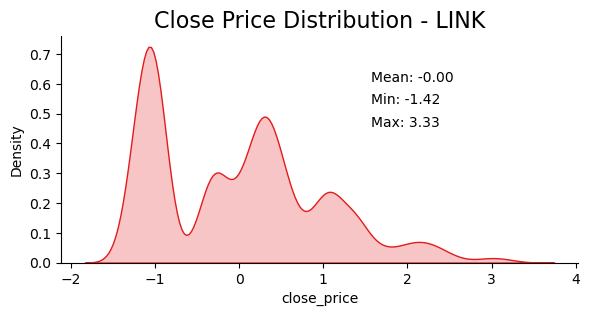

<Figure size 1000x600 with 0 Axes>

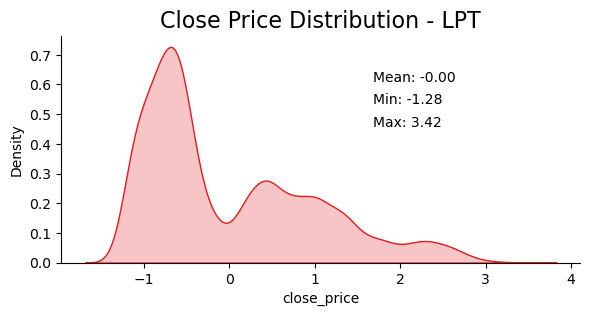

<Figure size 1000x600 with 0 Axes>

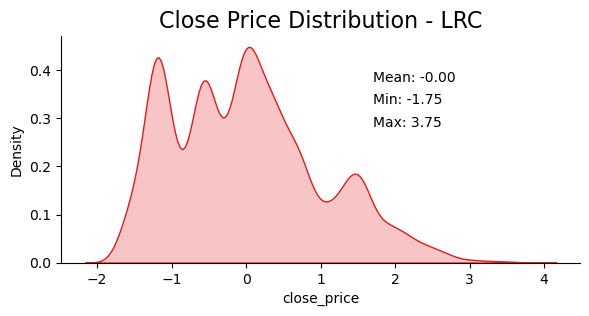

<Figure size 1000x600 with 0 Axes>

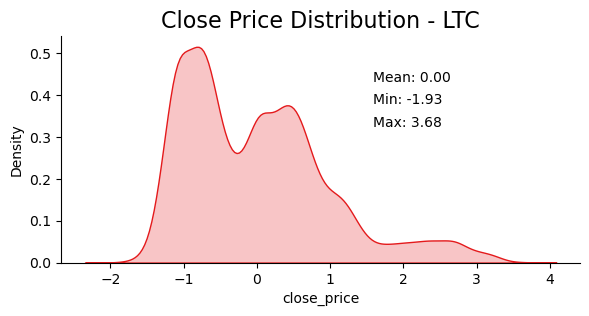

<Figure size 1000x600 with 0 Axes>

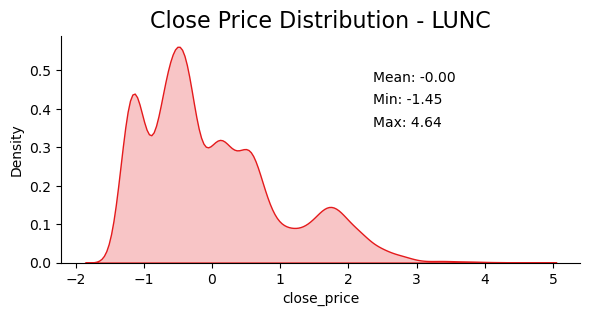

<Figure size 1000x600 with 0 Axes>

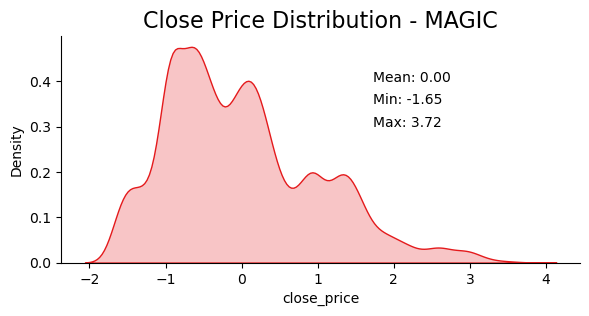

<Figure size 1000x600 with 0 Axes>

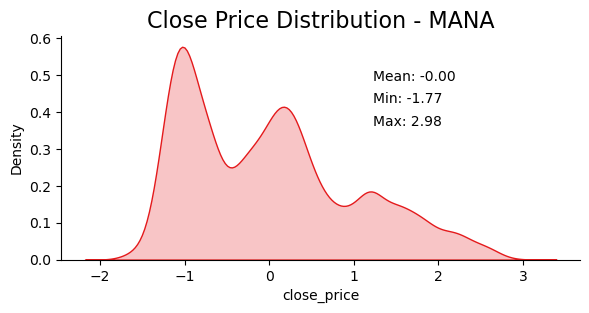

<Figure size 1000x600 with 0 Axes>

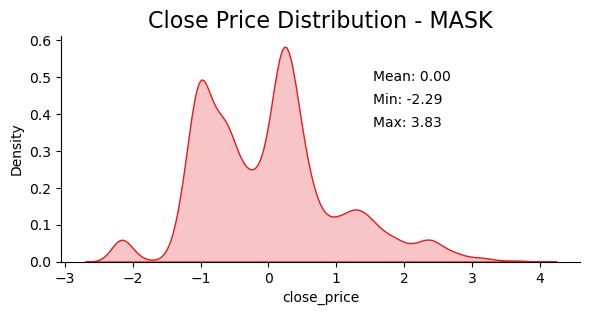

<Figure size 1000x600 with 0 Axes>

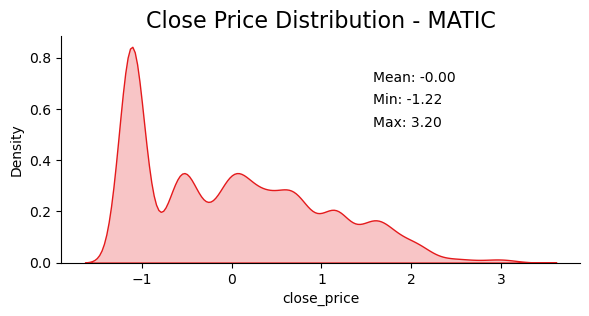

<Figure size 1000x600 with 0 Axes>

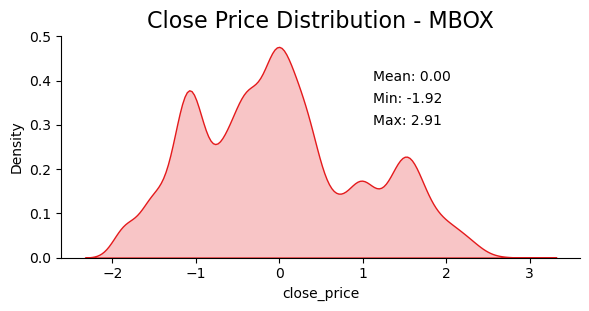

<Figure size 1000x600 with 0 Axes>

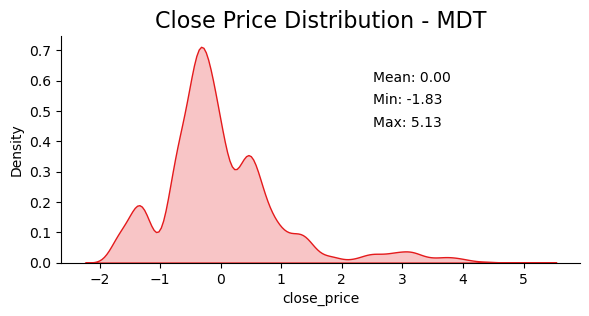

<Figure size 1000x600 with 0 Axes>

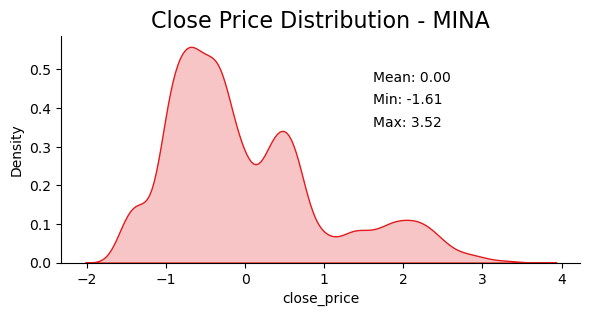

<Figure size 1000x600 with 0 Axes>

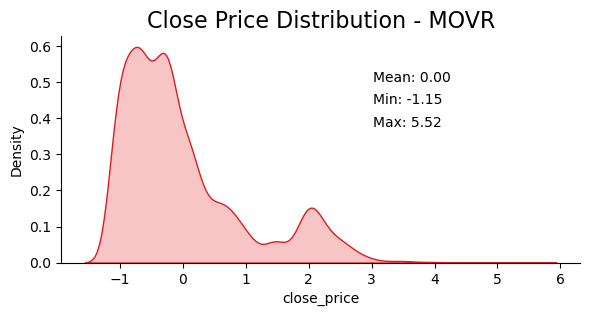

<Figure size 1000x600 with 0 Axes>

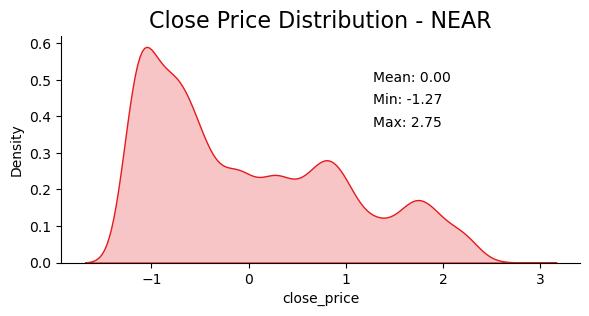

<Figure size 1000x600 with 0 Axes>

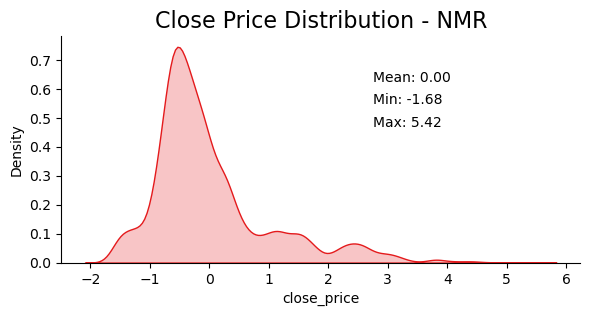

<Figure size 1000x600 with 0 Axes>

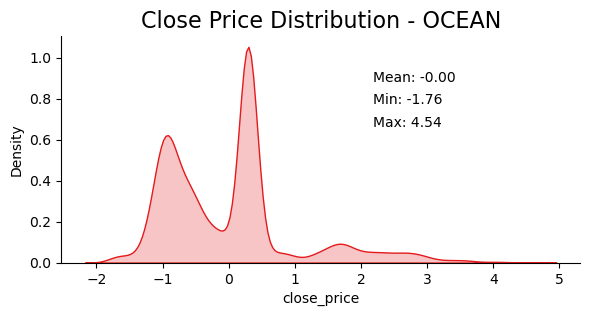

<Figure size 1000x600 with 0 Axes>

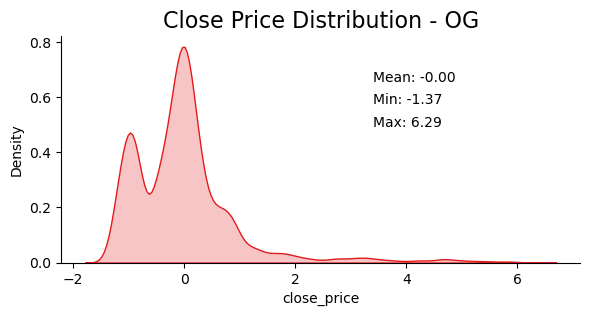

<Figure size 1000x600 with 0 Axes>

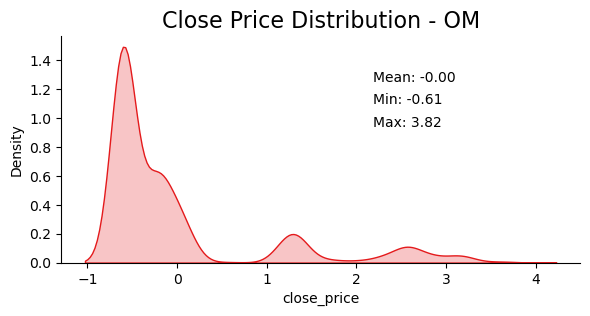

<Figure size 1000x600 with 0 Axes>

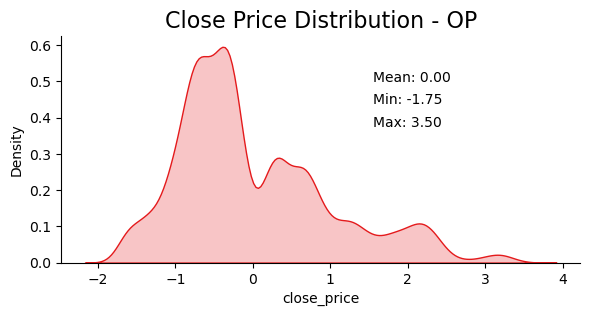

<Figure size 1000x600 with 0 Axes>

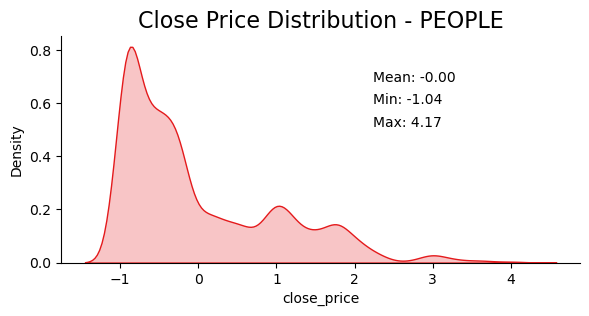

<Figure size 1000x600 with 0 Axes>

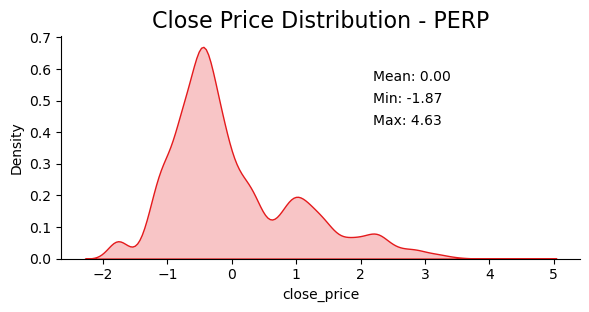

<Figure size 1000x600 with 0 Axes>

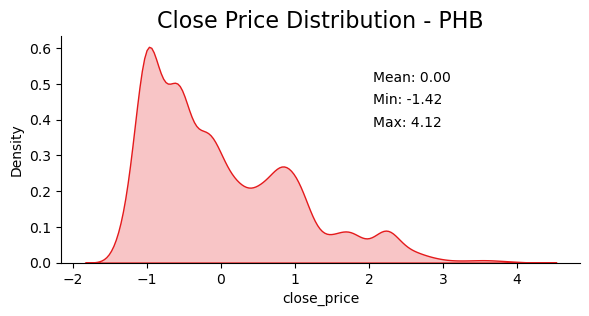

<Figure size 1000x600 with 0 Axes>

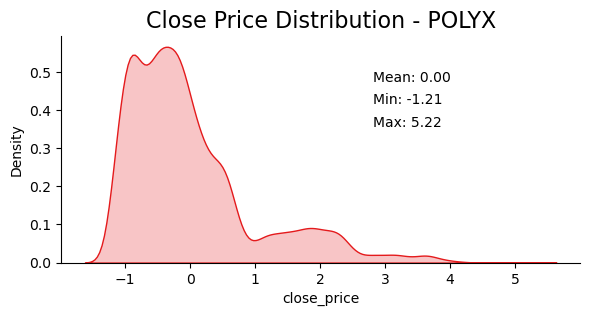

<Figure size 1000x600 with 0 Axes>

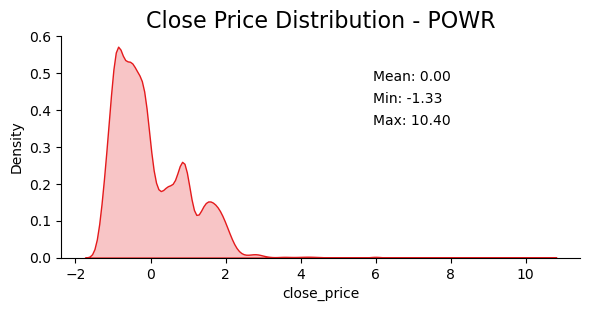

<Figure size 1000x600 with 0 Axes>

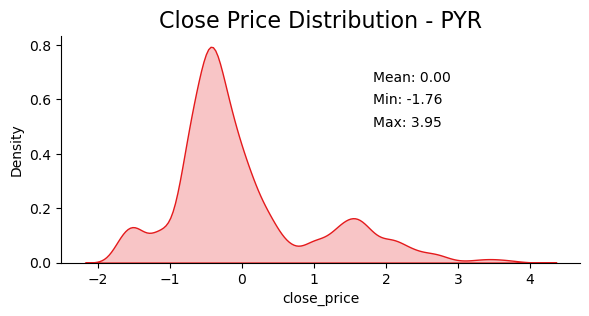

<Figure size 1000x600 with 0 Axes>

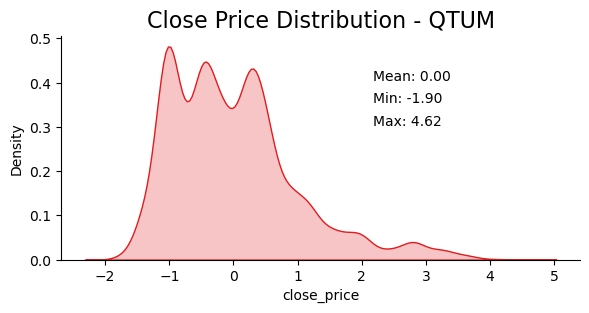

<Figure size 1000x600 with 0 Axes>

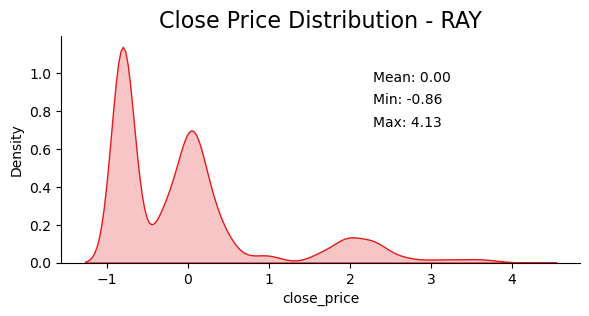

<Figure size 1000x600 with 0 Axes>

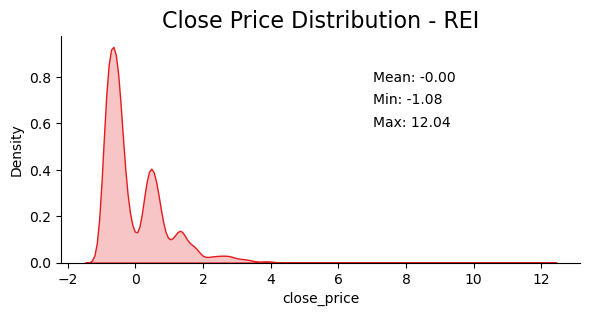

<Figure size 1000x600 with 0 Axes>

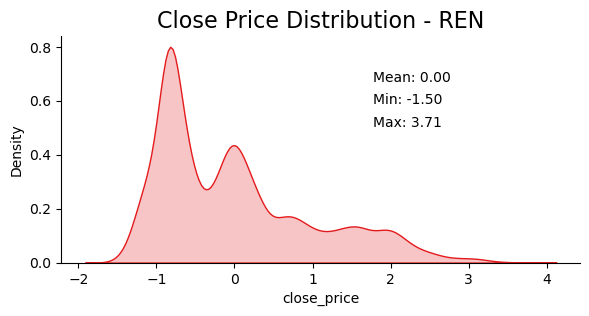

<Figure size 1000x600 with 0 Axes>

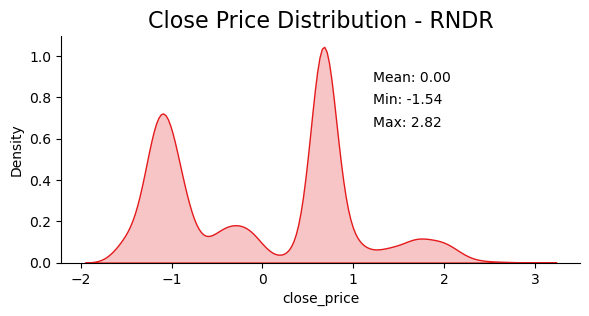

<Figure size 1000x600 with 0 Axes>

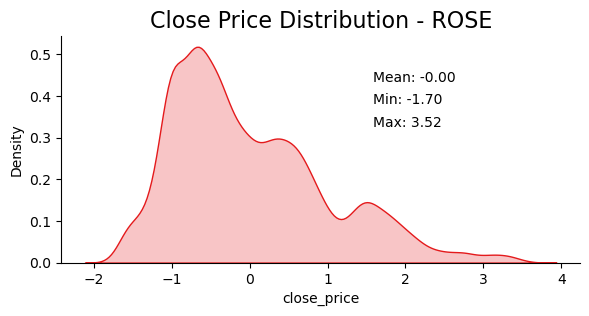

<Figure size 1000x600 with 0 Axes>

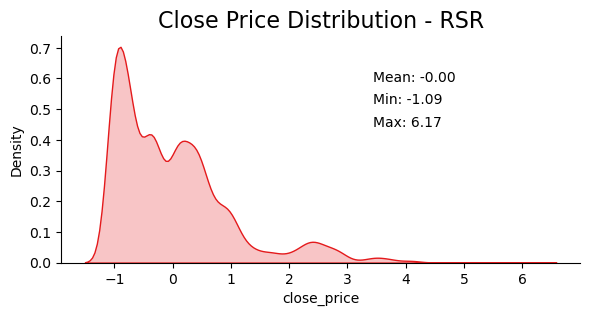

<Figure size 1000x600 with 0 Axes>

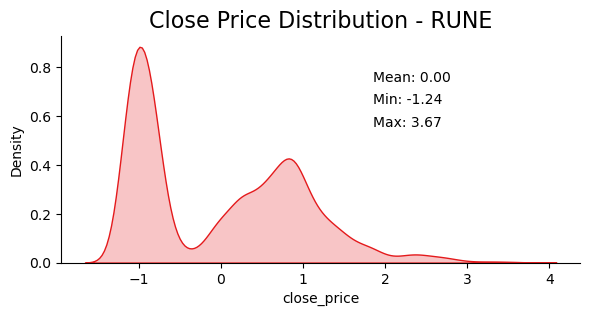

<Figure size 1000x600 with 0 Axes>

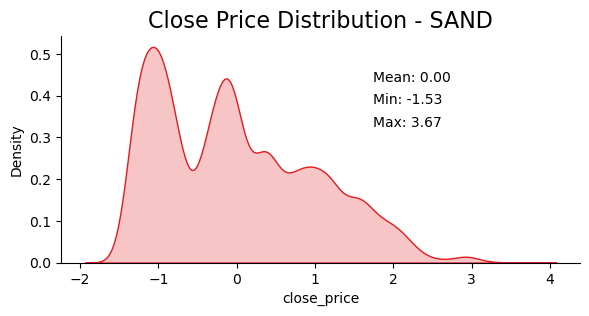

<Figure size 1000x600 with 0 Axes>

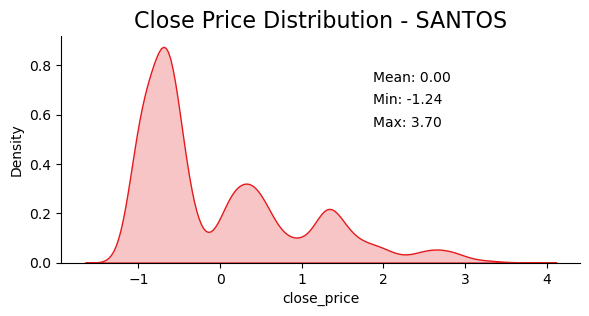

<Figure size 1000x600 with 0 Axes>

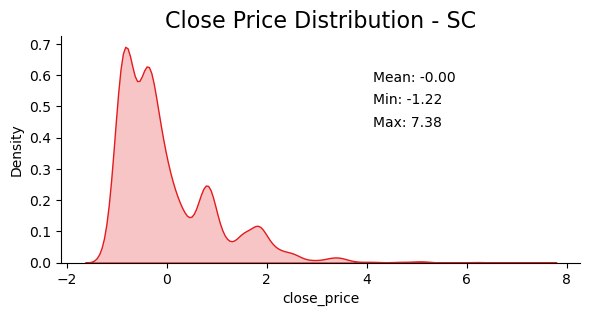

<Figure size 1000x600 with 0 Axes>

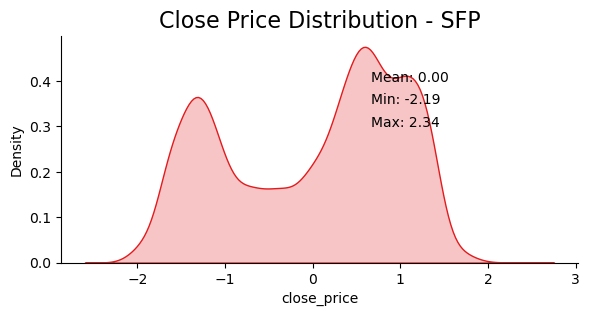

<Figure size 1000x600 with 0 Axes>

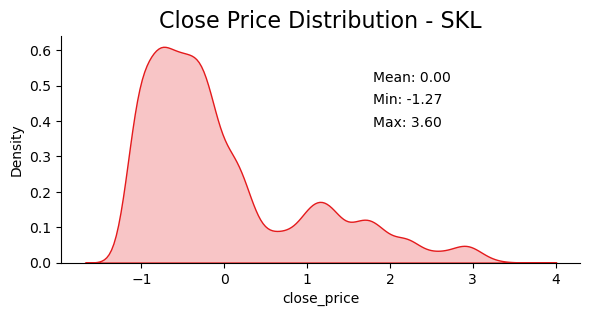

<Figure size 1000x600 with 0 Axes>

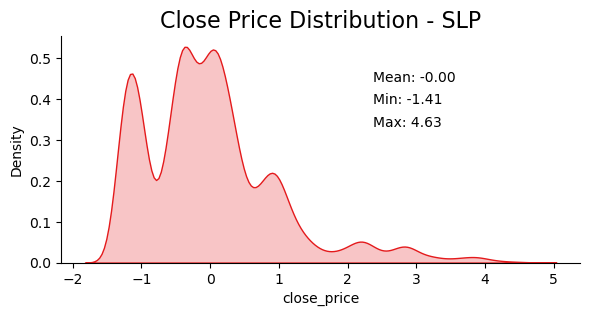

<Figure size 1000x600 with 0 Axes>

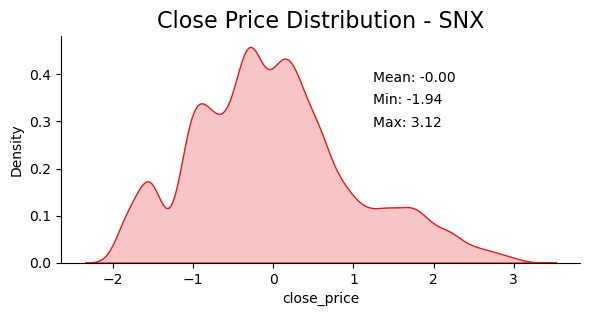

<Figure size 1000x600 with 0 Axes>

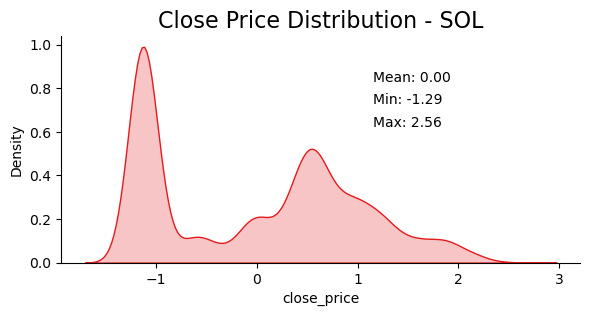

<Figure size 1000x600 with 0 Axes>

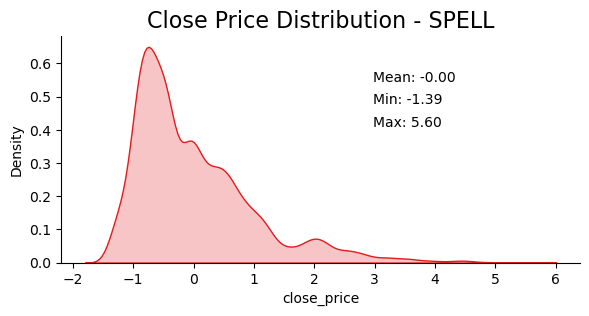

<Figure size 1000x600 with 0 Axes>

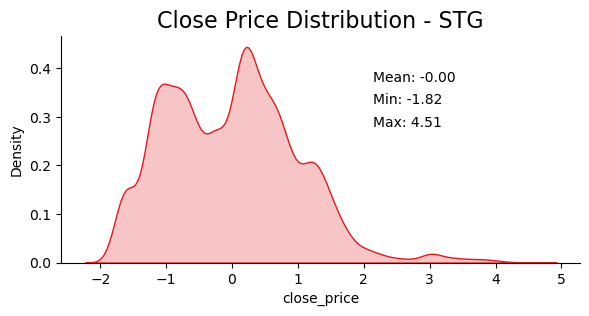

<Figure size 1000x600 with 0 Axes>

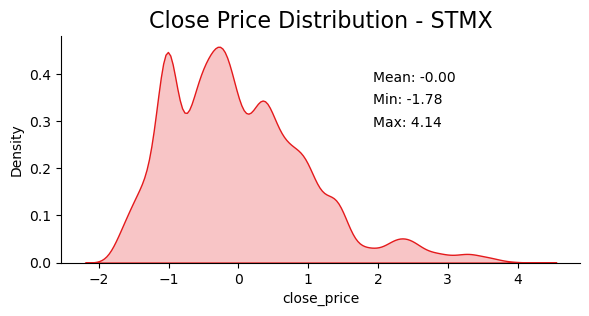

<Figure size 1000x600 with 0 Axes>

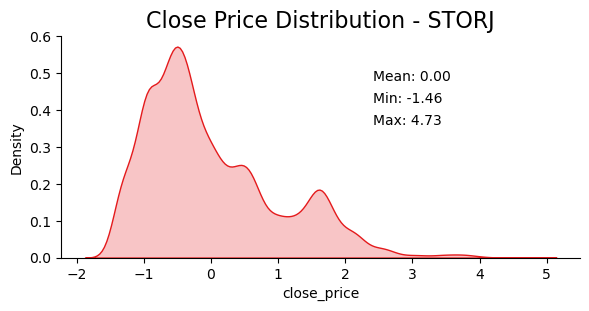

<Figure size 1000x600 with 0 Axes>

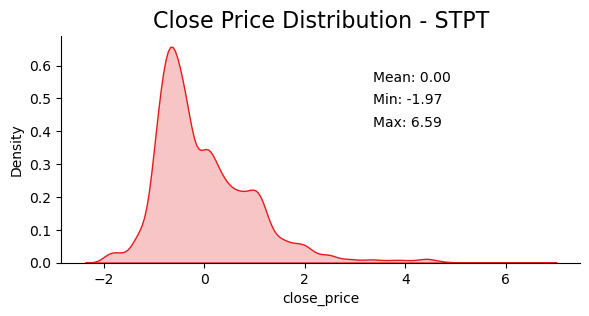

<Figure size 1000x600 with 0 Axes>

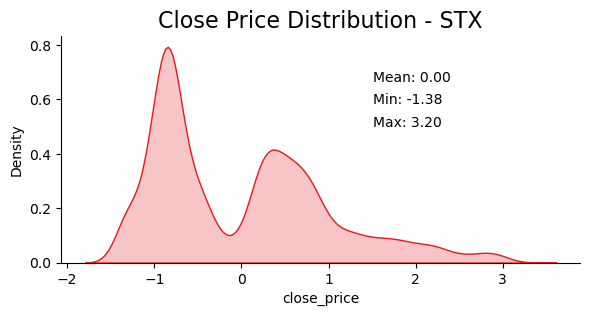

<Figure size 1000x600 with 0 Axes>

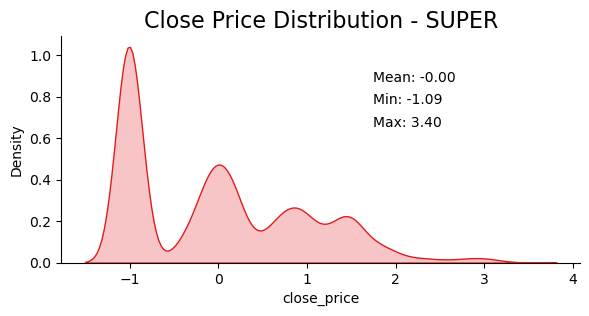

<Figure size 1000x600 with 0 Axes>

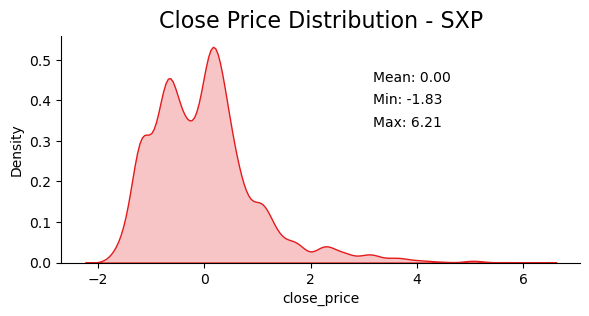

<Figure size 1000x600 with 0 Axes>

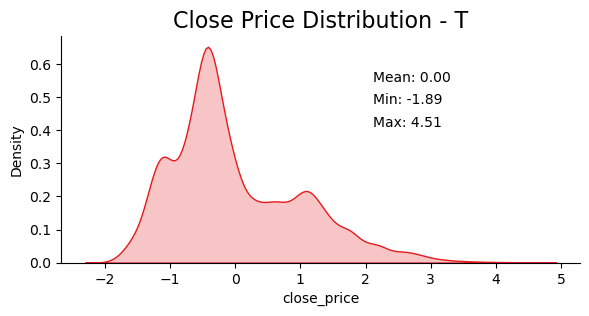

<Figure size 1000x600 with 0 Axes>

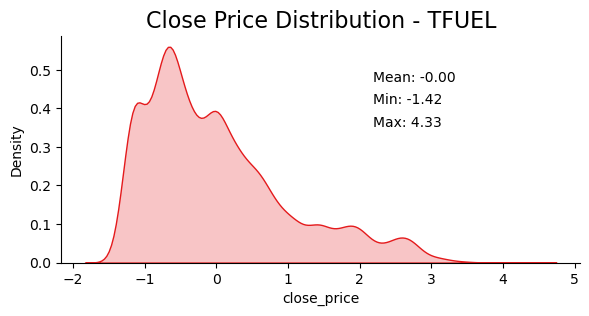

<Figure size 1000x600 with 0 Axes>

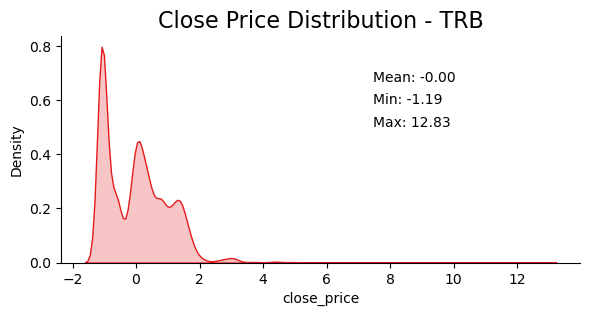

<Figure size 1000x600 with 0 Axes>

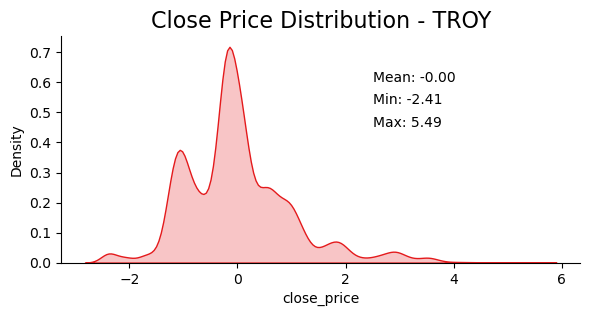

<Figure size 1000x600 with 0 Axes>

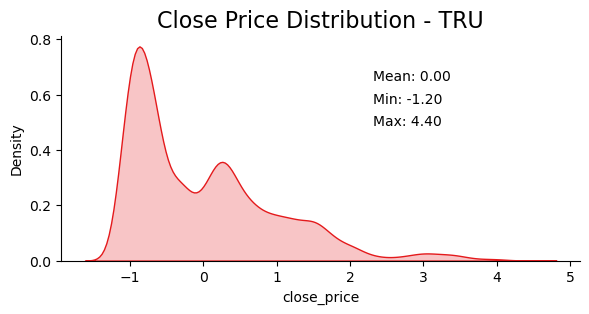

<Figure size 1000x600 with 0 Axes>

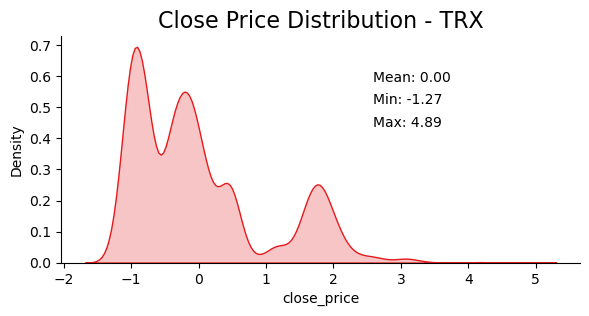

<Figure size 1000x600 with 0 Axes>

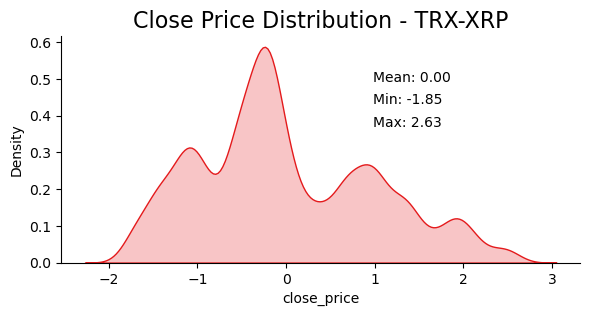

<Figure size 1000x600 with 0 Axes>

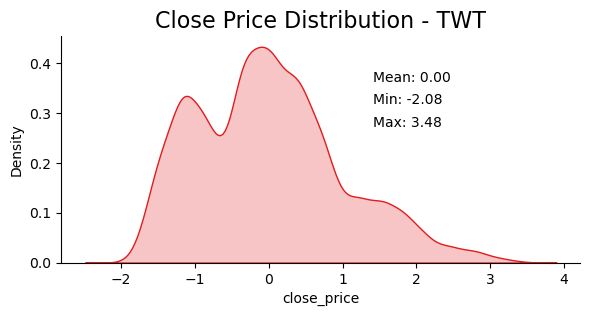

<Figure size 1000x600 with 0 Axes>

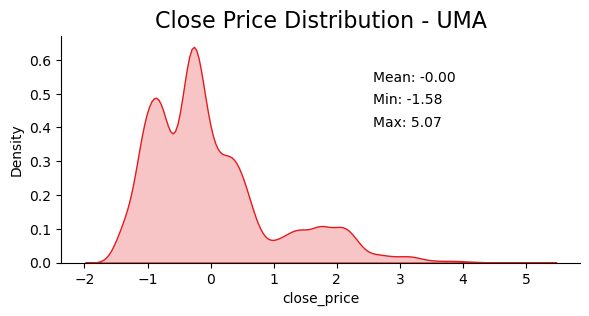

<Figure size 1000x600 with 0 Axes>

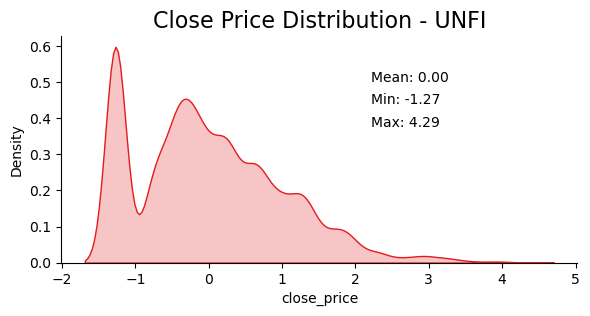

<Figure size 1000x600 with 0 Axes>

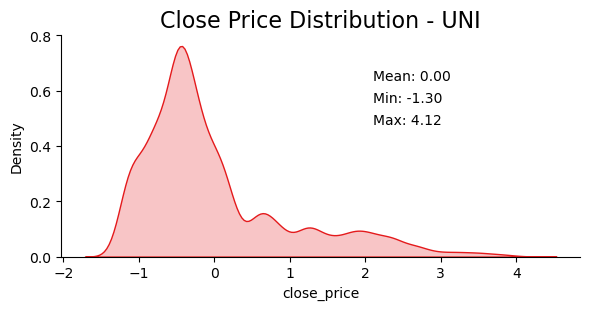

<Figure size 1000x600 with 0 Axes>

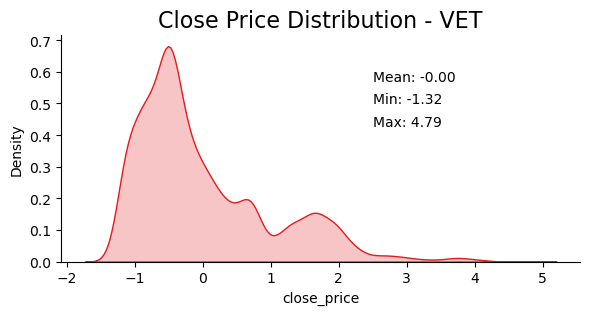

<Figure size 1000x600 with 0 Axes>

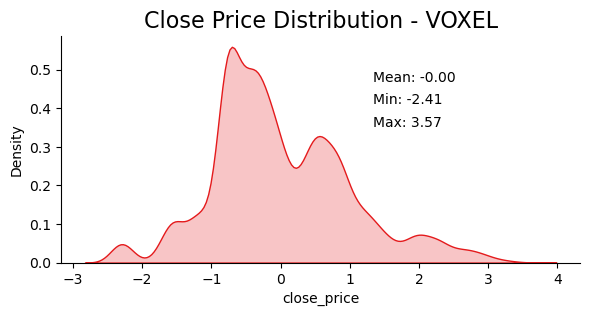

<Figure size 1000x600 with 0 Axes>

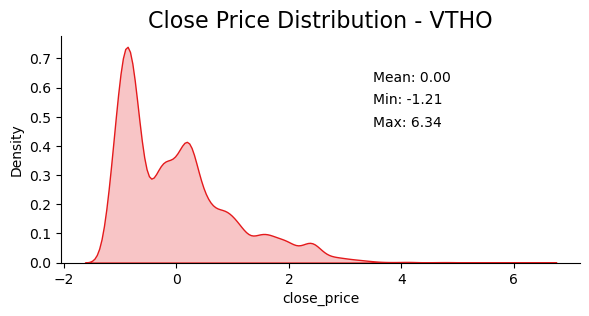

<Figure size 1000x600 with 0 Axes>

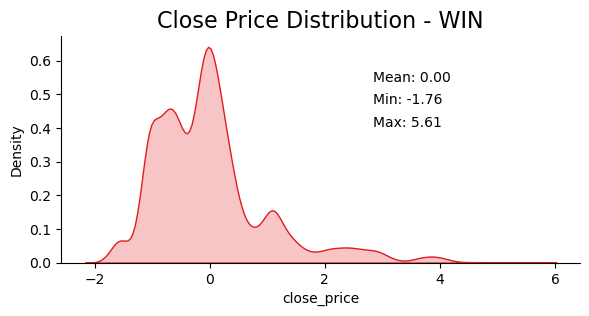

<Figure size 1000x600 with 0 Axes>

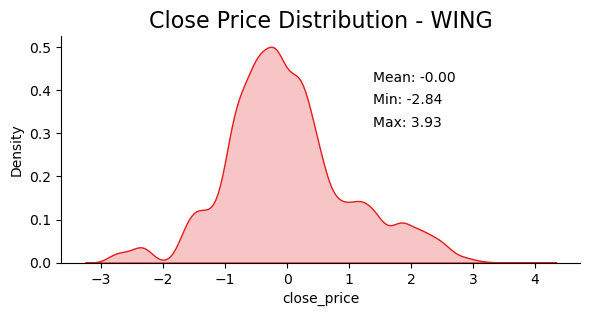

<Figure size 1000x600 with 0 Axes>

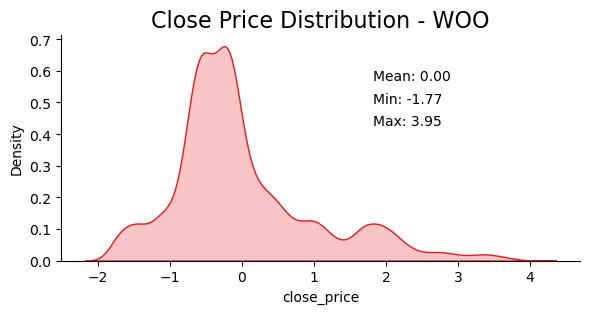

<Figure size 1000x600 with 0 Axes>

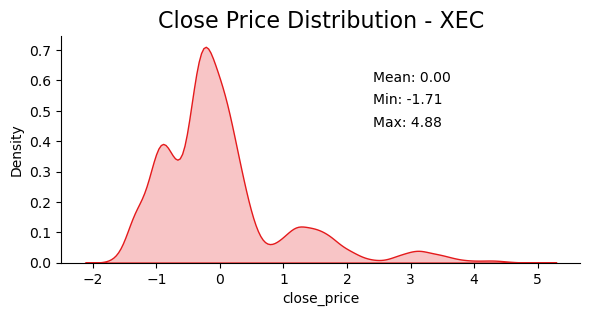

<Figure size 1000x600 with 0 Axes>

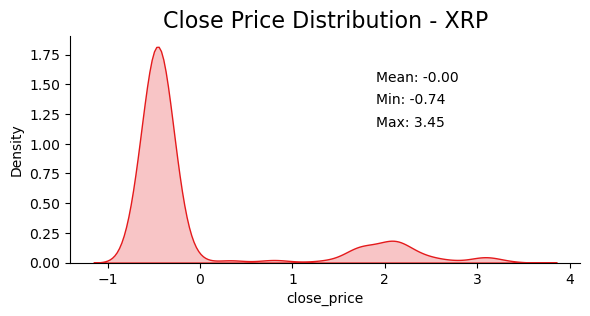

<Figure size 1000x600 with 0 Axes>

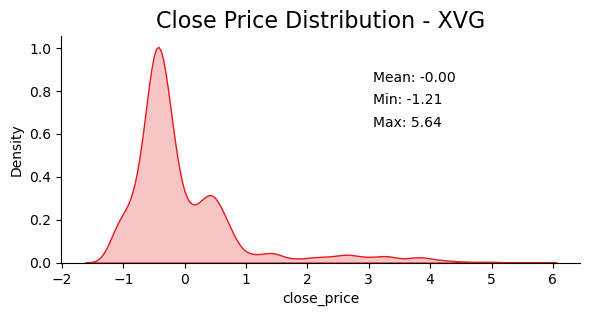

<Figure size 1000x600 with 0 Axes>

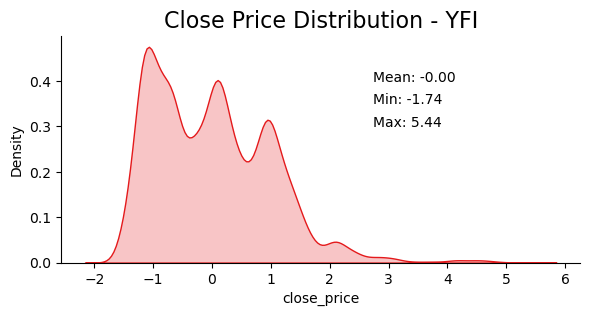

<Figure size 1000x600 with 0 Axes>

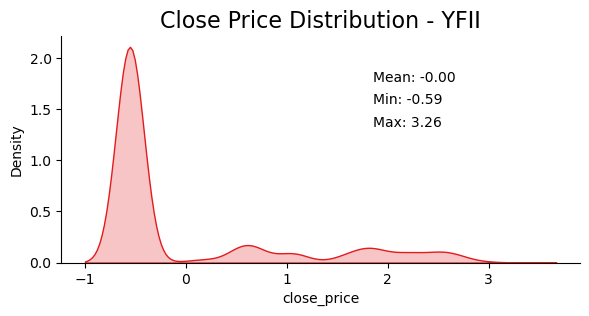

<Figure size 1000x600 with 0 Axes>

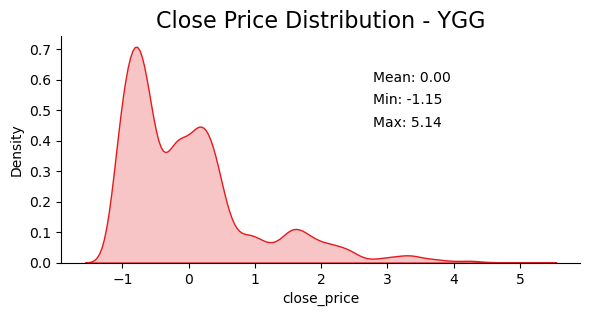

<Figure size 1000x600 with 0 Axes>

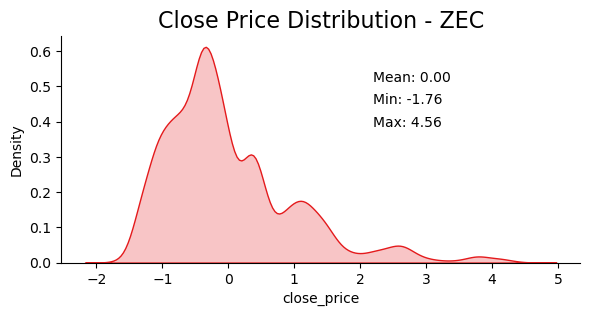

<Figure size 1000x600 with 0 Axes>

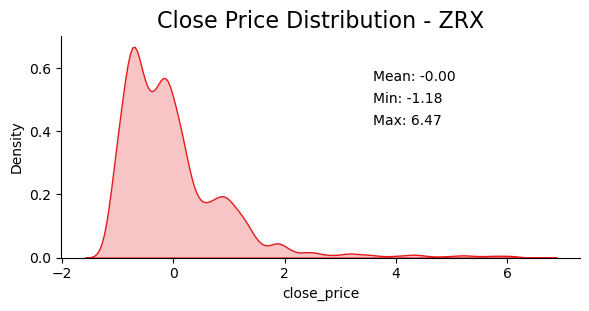

In [70]:
sns.set_palette("Set1", desat=1)
grouped = close_df.groupby('coin')


for coin_name, df_coin in grouped:
    plt.figure(figsize=(10, 6))

    facetgrid = sns.FacetGrid(df_coin, height=3, aspect=2)
    facetgrid.map(sns.kdeplot, 'close_price', fill=True)

    mean_val = df_coin['close_price'].mean()
    min_val = df_coin['close_price'].min()
    max_val = df_coin['close_price'].max()

    plt.text(0.6, 0.8, f"Mean: {mean_val:.2f}", transform=plt.gca().transAxes)
    plt.text(0.6, 0.7, f"Min: {min_val:.2f}", transform=plt.gca().transAxes)
    plt.text(0.6, 0.6, f"Max: {max_val:.2f}", transform=plt.gca().transAxes)

    plt.title(f'Close Price Distribution - {coin_name.upper()}', fontsize=16)
    plt.show()
